# FPoliSolutions: Predictive Maintenance
## Exploratory Data Analysis
#### By: Kathryn Lavelle

## A. Introduction

### **Project Details**
FPoliSolutions, LLC is an energy sector consulting firm responsible for monitoring and maintaining a wide network of interconnected system components. To support proactive maintenance and reduce the risk of unexpected failures, the company provided vibrational sensor data collected from these components. The goal was to detect pattern shifts in the data that might signal component degradation, and ultimately build predictive models capable of flagging potential failures before they escalate into larger issues.

This project had two primary objectives:
1. Train a model that accurately classifies a failure event (`Y = 1`)
2. Identify the input variables that most strongly influence the probability of a failure occurring

This is a `classification` problem. The dataset contains 64 total columns: 63 continuous input variables and one binary output variable. The output takes one of two values: 1, indicating that a failure event occurred, and 0, indicating that no failure occurred. Failure events make up approximately 61.88% of the dataset, which means any useful model must exceed this baseline accuracy of 62%.

##### **Input Variables**

All 63 input variables are stored as float64 and are named using one of three prefixes - X, Z, or V - which reflect the feature extraction method used to derive each variable. The dataset includes 25 `X` variables (X01–X25), 9 `Z` variables (Z01–Z09), and 29 `V` variables (V01–V29), each capturing different aspects of the vibrational signal patterns.

##### **Output Variables**

The single output column, Y, is stored as int64 and represents whether a failure event took place during a given observation.

### **Key Findings**

Exploratory data analysis revealed that most input variables followed an approximately Gaussian distribution, though several exhibited notable positive skew. An inverse transformation proved most effective at correcting this skew. The data also required standardization to address differences in scale and magnitude across variables. A high degree of multicollinearity was identified among the input variables, though no missing values were present in the dataset.

To address the multicollinearity, Principal Component Analysis (PCA) was applied. Hierarchical clustering and a knee-bend plot were used to determine that two clusters represented the optimal structure in the data. When PCA was run without a fixed number of components, 64 components were produced; however, plotting the variance across components confirmed that the first two principal components captured the most meaningful variation, supporting the decision to model with just two PCs.

Models were trained using both the full set of input variables and the principal components, and with both original and transformed inputs. Among all inputs, `X02`, `V01`, and `V26` appeared to have the strongest influence on the predicted outcome. Notably, as `X02` increases toward positive values, the predicted failure probability approaches 1, and across varying values of `V01` and `V26`, `X02` consistently drove predicted probabilities toward 1. This suggests `X02` plays a particularly influential role in predicting failures.

In terms of model performance, `Model 3` achieved the highest training accuracy at `95%`, though its cross-validation accuracy on test data was lower, likely due to overfitting given its 64 regression coefficients. `Model 4`, which used only 2 regression coefficients derived from the principal components, generalized better and reached approximately `73%` accuracy on the test data. This suggests that using PCA to reduce multicollinearity helped improve out-of-sample performance. All models ultimately exceeded the `61.88%` baseline threshold, confirming that meaningful predictive signal was captured in the data.

##### **Application of Learned Skills**
I chose this project because it provided me with an opportunity perform a predicitve analysis on simulated vibrational data. I am very interested in learning to build models for brain wave patterns that predict human thought and speech. This project taught me how to explore a data set, look for highly correlated or skewed values, and fit and train models that can be used to predict the probability of an event. Brain wave data would also be in the form of vibrations so this was a good introduction to manipulating the data, and fitting and testing models. Other applications for predictive models of vibrational data could include human-computer interfaces for medical therapies, video games, and specialized Natural Language Processing (NLP) systems.

### Import Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import statsmodels.formula.api as smf

from scipy.cluster import hierarchy

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

### Read data

In [2]:
# Read in the data from the .csv file
df = pd.read_csv('training_data.csv')

In [ ]:
print(df)

## B. Exploratory Data Analysis (EDA)

### Essential Data Exploration

In [3]:
# Display number of rows and columns
df.shape

(223, 64)

In [4]:
# Display column names and their data types
df.dtypes

X01    float64
X02    float64
X03    float64
X04    float64
X05    float64
        ...   
V26    float64
V27    float64
V28    float64
V29    float64
Y        int64
Length: 64, dtype: object

In [5]:
df.dtypes.value_counts()

float64    63
int64       1
Name: count, dtype: int64

In [6]:
# Dipslay the number of missing values for each column
df.isna().sum()

X01    0
X02    0
X03    0
X04    0
X05    0
      ..
V26    0
V27    0
V28    0
V29    0
Y      0
Length: 64, dtype: int64

In [7]:
# Display the number of unique values for each column
df.nunique(dropna=True)

X01    223
X02    223
X03    223
X04    223
X05    223
      ... 
V26    223
V27    223
V28    223
V29    223
Y        2
Length: 64, dtype: int64

### Visualize Marginal Data

For exploration purposes, we will will treat the numeric column `Y` as a non-numeric, categorial variable since it has only two possible values: 0 or 1.

#### Categorical Variables: `Y`

In [8]:
# Display the count for categorical variable `Y`
df.Y.value_counts()

Y
1    138
0     85
Name: count, dtype: int64

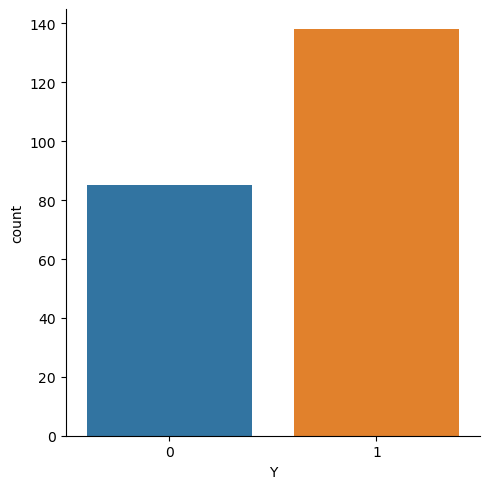

In [9]:
# Visualize output variable `Y` as a categorical variable
sns.catplot(data=df, x='Y', kind='count')

plt.show()

#### Continuous Variables: `X01 - X25`, `Z01 - Z09`, `V01 - V29`

In [10]:
# Create an object that contains just the input column names
input_names = df.drop(columns=['Y']).columns

In [11]:
# Create a DataFarme to hold the input variables
df_inputs = df.drop(columns=['Y']).copy()

In [12]:
# Melt the original data set for easier visualizations
# Use the `input_names` list to specify which columns to stack
lf = df.copy().\
reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid', 'Y'], value_vars=input_names, ignore_index=True)

In [13]:
lf

,rowid,Y,variable,value
0,0,1,X01,-2.907070
1,1,1,X01,-4.608052
2,2,1,X01,4.338816
3,3,0,X01,-1.835062
4,4,1,X01,13.990969
...,...,...,...,...
14044,218,0,V29,-100.512718
14045,219,1,V29,-118.299085
14046,220,1,V29,-102.237684
14047,221,1,V29,-119.015441


Although we will treat `Y` as categorical, let's visualize it as a continuous variable too.

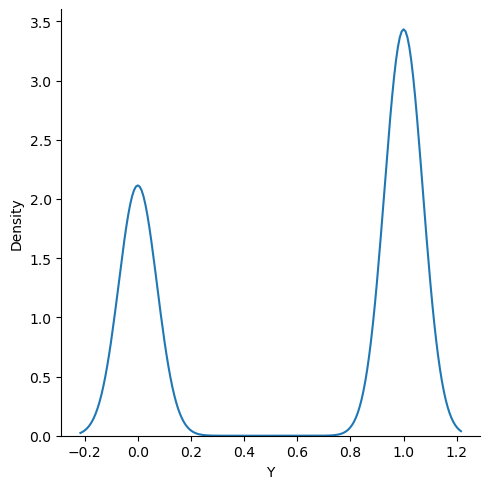

In [14]:
# Visualize `Y` as a continuous variable using a denisty plot
sns.displot(data=lf, x='Y', kind='kde', common_norm=False)

plt.show()

The density plot for `Y` shows there is a higher density of `1` values than `0`.

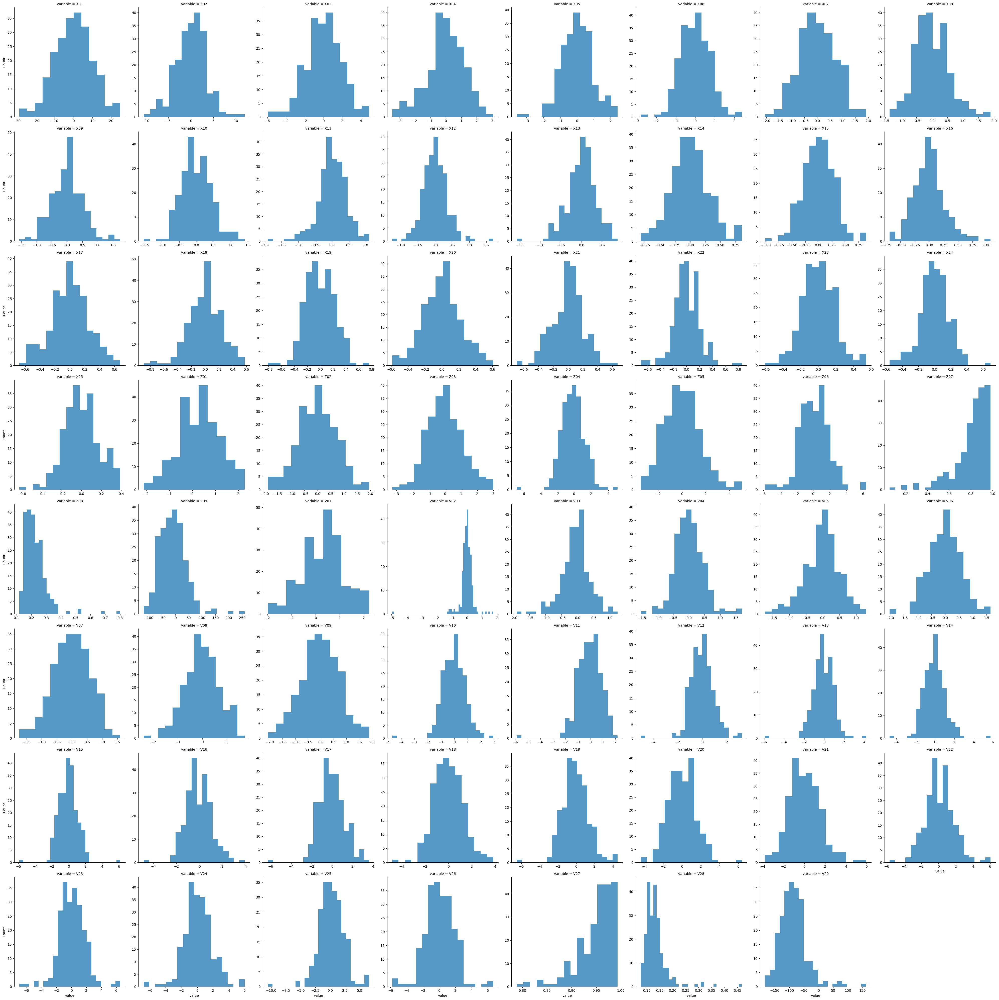

In [15]:
# Visualize all of the input variables using faceted histograms
sns.displot(data=lf, x='value', col='variable', kind='hist',\
col_wrap=8, facet_kws={'sharex': False, 'sharey': False},\
common_bins=False)

plt.show()

Most of the input distributions show symmetry. Some subplot shapes appear Gaussian (bell-like), with the majority of the data counts in the center. However, there are a few that appear to be skewed to the left or right.

Let's change the number of facets per column and add the `Kernal Density Estimate (KDE)` to get a closer look at the symmetry of the input distributions.

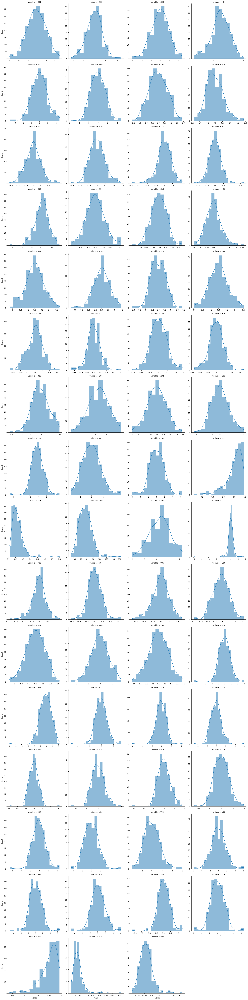

In [16]:
# Visualize the input distributions with KDE
sns.displot(data=lf, x='value', col='variable', kind='hist', kde=True,\
col_wrap=4, facet_kws={'sharex': False, 'sharey': False},\
common_bins=False)

plt.show()

### Visualize Relationships

#### Relationships between continuous variables

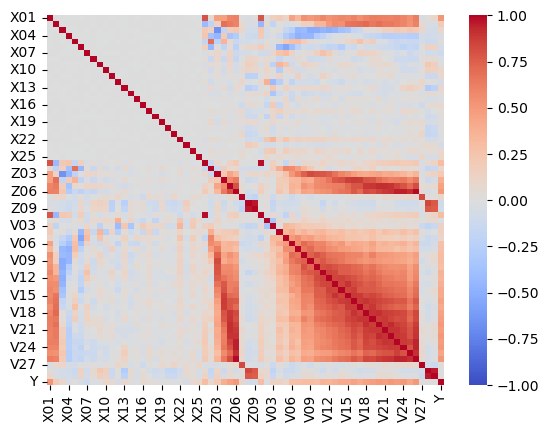

In [17]:
# Visualize the correclation of the numeric columns using a heatmap
fig, ax = plt.subplots()

sns.heatmap(data=df.corr(), vmin=-1, vmax=1, center=0,
            cmap='coolwarm', ax=ax)

plt.show()

The heat map shows us that there is a `high correlation` between all of the numeric variables.

Let's separate all of the `X`, `Z`, and `V` inputs and use a heatmap to see if there is a correlation between the smaller subsets of input variables.

In [18]:
# Create a DataFrame with just the `X` inputs
df_inputs_X = pd.DataFrame(df, columns=['X01', 'X02', 'X03', 'X04', 'X05',\
                                        'X06', 'X07', 'X08', 'X09', 'X10',\
                                        'X11', 'X12', 'X13', 'X14', 'X15',\
                                        'X16', 'X17', 'X18', 'X19', 'X20',\
                                        'X21', 'X22', 'X23', 'X24', 'X25'])

In [19]:
# Create a DataFrame with just the `Z` inputs
df_inputs_Z = pd.DataFrame(df, columns=['Z01', 'Z02', 'Z03', 'Z04', 'Z05',\
                                        'Z06', 'Z07', 'Z08', 'Z09'])

In [20]:
# Create a DataFrame with just the `V` inputs
df_inputs_V = pd.DataFrame(df, columns=['V01', 'V02', 'V03', 'V04', 'V05',\
                                        'V06', 'V07', 'V08', 'V09', 'V10',\
                                        'V11', 'V12', 'V13', 'V14', 'V15',\
                                        'V16', 'V17', 'V18', 'V19', 'V20',\
                                        'V21', 'V22', 'V23', 'V24', 'V25',\
                                        'V26', 'V27', 'V28', 'V29'])

In [21]:
# Group the `X` and `Z` inputs
df_group_X_Z = pd.concat([df_inputs_X, df_inputs_Z], axis=1)

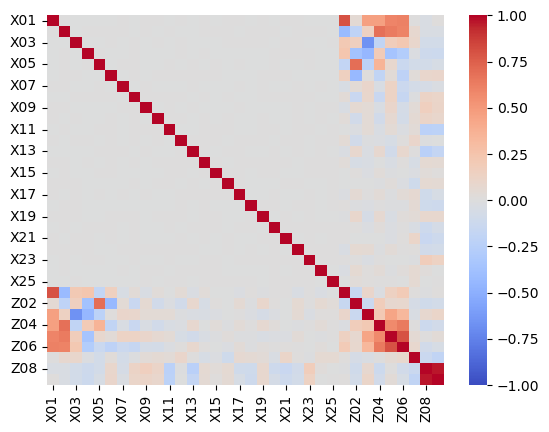

In [22]:
# Visualize the correlation between the `X` and `Z` inputs
fig, ax = plt.subplots()

sns.heatmap(data=df_group_X_Z.corr(), vmin=-1, vmax=1, center=0,
            cmap='coolwarm', ax=ax)

plt.show()

In [23]:
# Group the `X` and `V` inputs
df_group_X_V = pd.concat([df_inputs_X, df_inputs_V], axis=1)

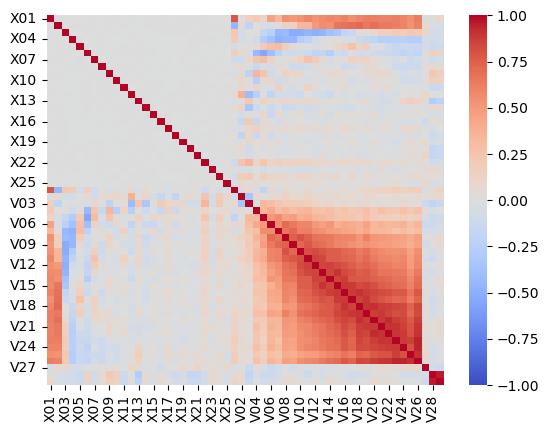

In [24]:
# Visualize the correlation between the `X` and `V` inputs
fig, ax = plt.subplots()

sns.heatmap(data=df_group_X_V.corr(), vmin=-1, vmax=1, center=0,
            cmap='coolwarm', ax=ax)

plt.show()

In [25]:
# Group the `Z` and `V` inputs
df_group_Z_V = pd.concat([df_inputs_Z, df_inputs_V], axis=1)

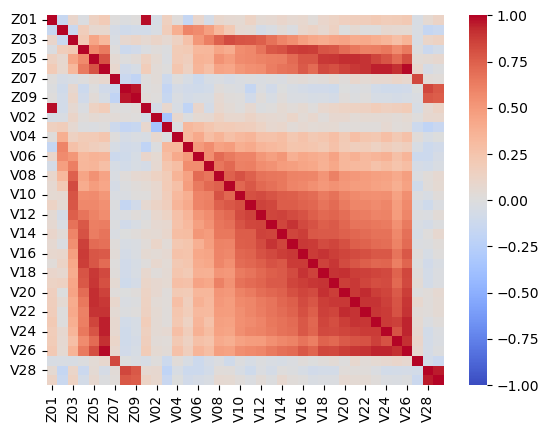

In [26]:
# Visualize the correlation between the `Z` and `V` inputs
fig, ax = plt.subplots()

sns.heatmap(data=df_group_Z_V.corr(), vmin=-1, vmax=1, center=0,
            cmap='coolwarm', ax=ax)

plt.show()

We can see that there is also a `high correlation` between the subgroups. We will need to use PCA to account for this high correlation between input variables.

#### Summaries of continuous variables grouped by categorical variables

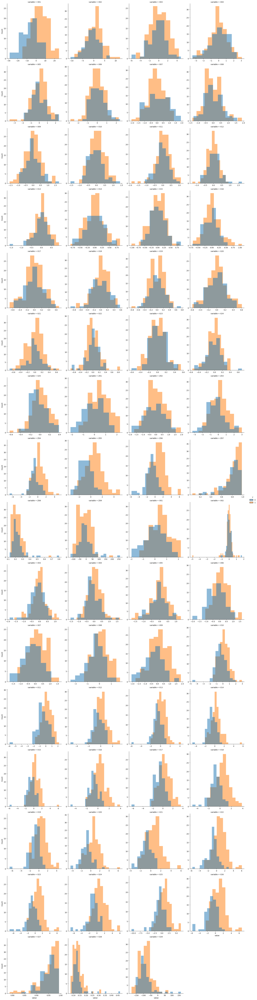

In [27]:
# Visualize the marginal distribution of the input variables grouped by the output variable
sns.displot(data=lf, x='value', col='variable', hue='Y', kind='hist',\
col_wrap=4, facet_kws={'sharex': False, 'sharey': False},\
common_bins=False)

plt.show()

In [28]:
# Combine the inputs and Y output data
df_inputs_ZY = pd.concat([df_inputs_Z, df.Y], axis=1)
df_inputs_XY = pd.concat([df_inputs_X, df.Y], axis=1)
df_inputs_VY = pd.concat([df_inputs_V, df.Y], axis=1)

In [29]:
# Get list of input column names
z_input_names = df_inputs_Z.columns
x_input_names = df_inputs_X.columns
v_input_names = df_inputs_V.columns

In [30]:
# Melt the `Z` inputs and Y output into separate objects for easier visualization
lf_inputs_ZY = df_inputs_ZY.copy().\
reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid', 'Y'], value_vars=z_input_names, ignore_index=True)

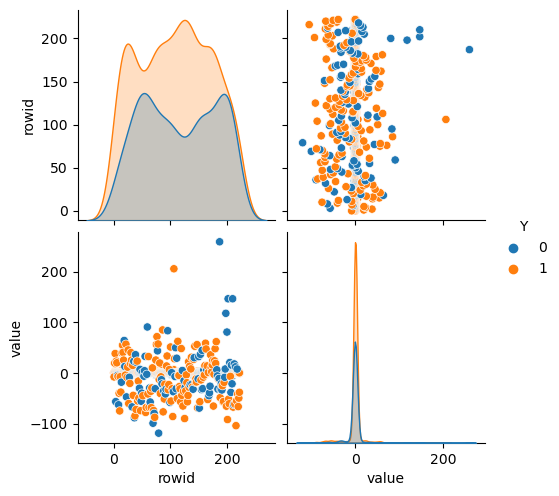

In [31]:
# Visualize the relationship between the `Z-named` inputs and `Y`
sns.pairplot(data = lf_inputs_ZY, hue='Y')

plt.show()

In [32]:
# Melt the `X` inputs and Y output into separate objects for easier visualization
lf_inputs_XY = df_inputs_XY.copy().\
reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid', 'Y'], value_vars=x_input_names, ignore_index=True)

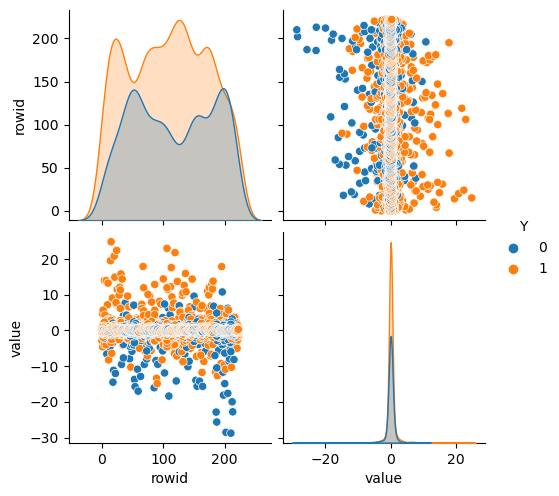

In [33]:
# Visualize the relationship between the `X-named` inputs and `Y`
sns.pairplot(data = lf_inputs_XY, hue='Y')

plt.show()

In [34]:
# Melt the `V` inputs and Y output into separate objects for easier visualization
lf_inputs_VY = df_inputs_VY.copy().\
reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid', 'Y'], value_vars=v_input_names, ignore_index=True)

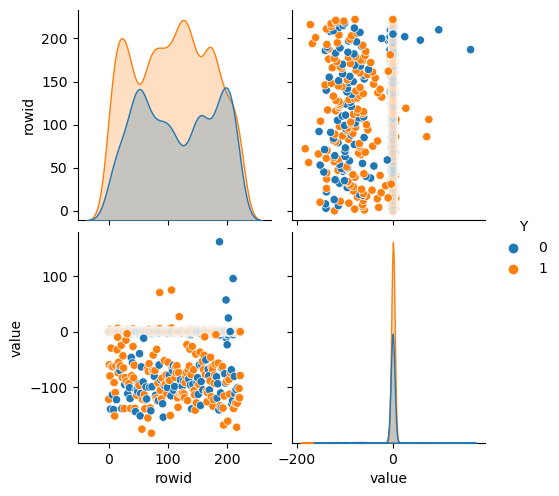

In [35]:
# Visualize the relationship between the `V-named` inputs and `Y`
sns.pairplot(data = lf_inputs_VY, hue='Y')

plt.show()

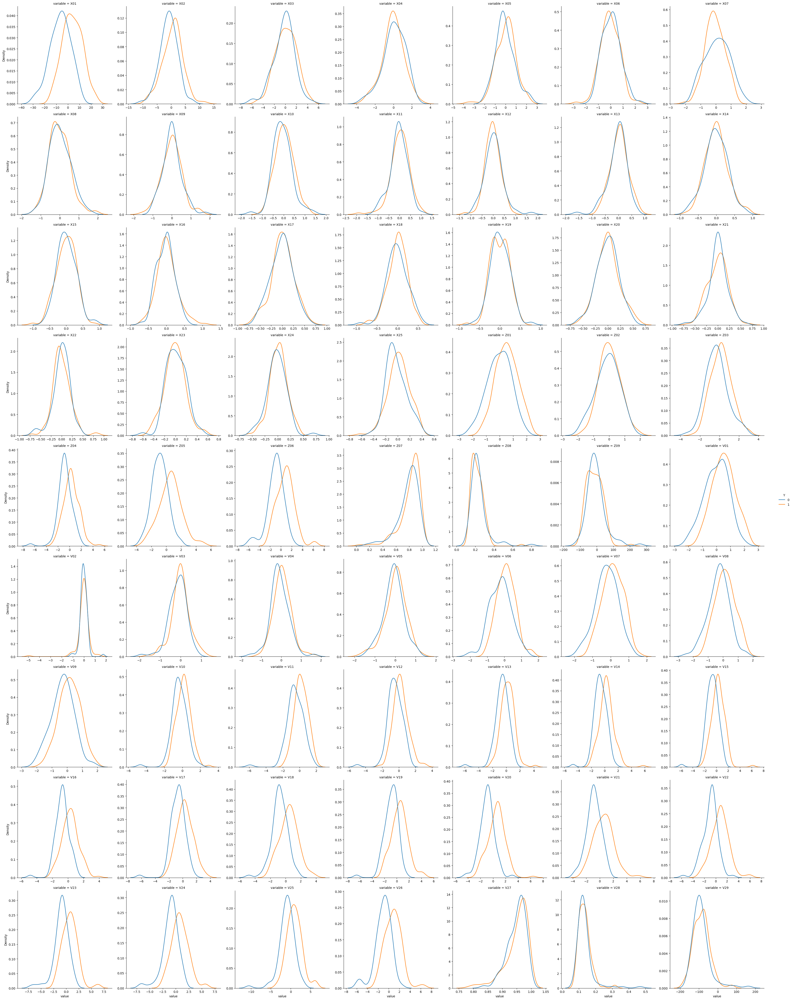

In [36]:
# Visualize the conditional KDE for input variables where we color by ouput
sns.displot(data=lf, x='value', col='variable', hue='Y', kind='kde',\
col_wrap=7, facet_kws={'sharex': False, 'sharey': False},\
common_norm=False)

plt.show()

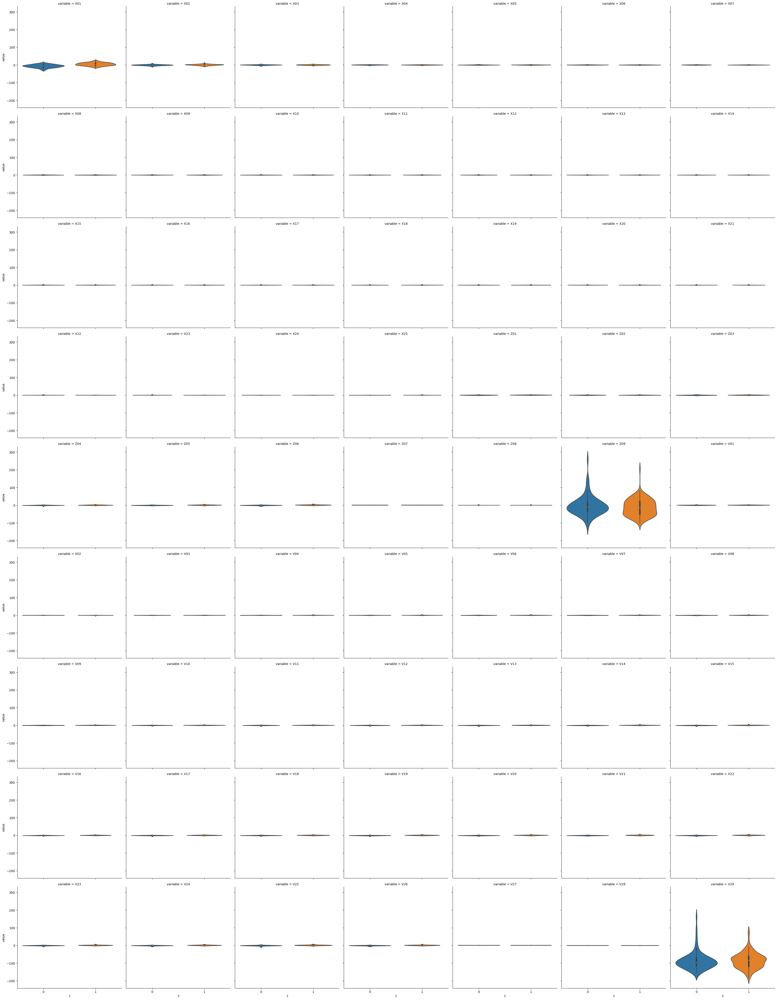

In [37]:
# Use a violin plot to compare the conditional distribution shapes
sns.catplot(data=lf, x='Y', y='value', col='variable', kind='violin',\
col_wrap=7, facet_kws={'sharex': False, 'sharey': False},\
common_norm=False)

plt.show()

The violin plot shows that variables `X01`, `Z09`, and `V29` have a greater distribution of observations for `Y`.

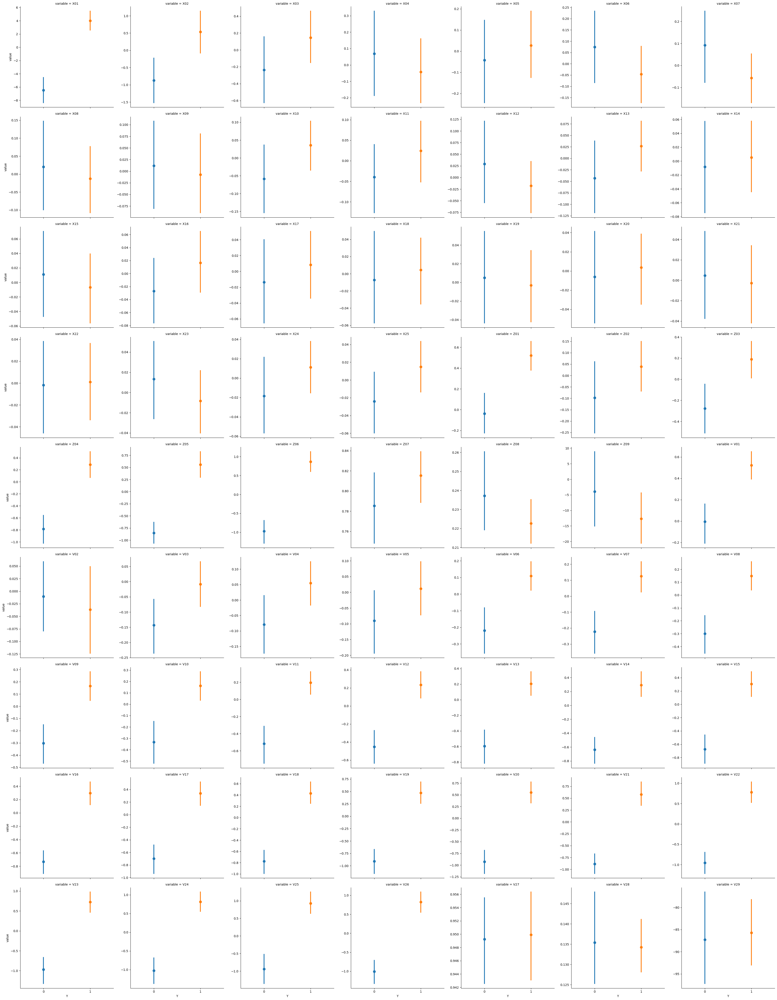

In [38]:
# Visualize the conditional means using a point plot 
sns.catplot(data=lf, x='Y', y='value', hue='Y', col='variable', kind='point',\
    col_wrap=7, join=False, sharey=False)

plt.show()

Let's use a boxplot to visualize how the median changes across the input data. This will help us to determine if the scales and magnitutes are consistent.

The box plot shows us that there are some inputs that have a higher magnitude, such as `V29`, `Z09`, and `X01`.

Let's display a box plot using the long format of the data, but group by the output `Y`.

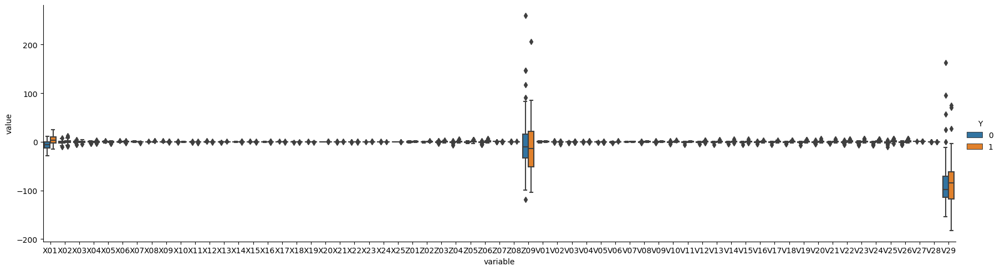

In [39]:
# Visualize a box plot of the input data grouped by Y
sns.catplot(data=lf, x='variable', y='value', hue='Y', kind='box', aspect=3.5)

plt.show()

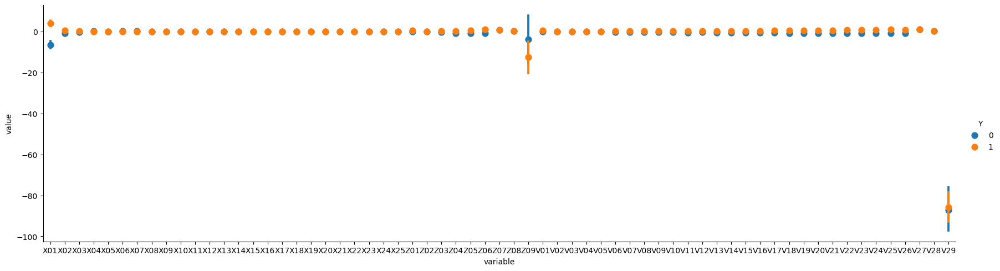

In [40]:
# Visualize the conditional means using a point plot given Y 
sns.catplot(data=lf, x='variable', y='value', hue='Y', kind='point',\
    join=False, aspect=3.5)

plt.show()

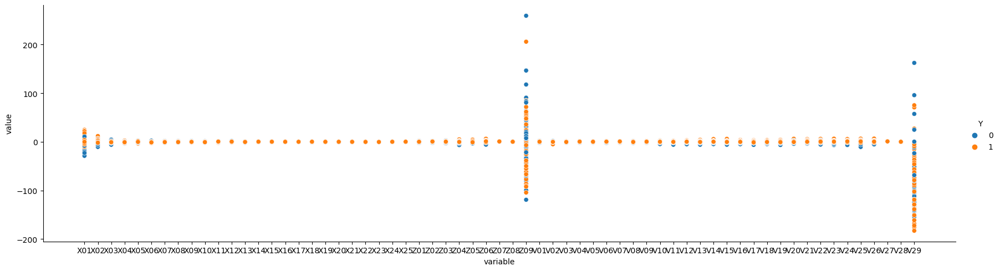

In [41]:
sns.relplot(data=lf, x='variable', y='value', hue='Y', aspect=3.5)

plt.show()

## C. Cluster Analysis

##### Variable Selection
We will peform a cluster analysis on all of the continous input values. This includes the values for the following columns:
* `X01` - `X25`
* `Z01` - `Z09`
* `V01` - `V29`

##### Analysis Considerations

As previoulsy viewed in the distribution histogram, most of these variables have a Gaussian-like distrubtion. Some varibles were found to have a notable skew. We also previoulsy visualized and determined that there is a high correlation between the input variables. There were no no missing values to account for in this data set.

### Preprocessing
Below we will standardize the continuous variables to remove any variables with a large magnitude and scale. We will then use an inverse transformation to help remove any skewed variables.

### Standardize the Data

In [42]:
# Standardize the input data
Xinput = StandardScaler().fit_transform(df_inputs)

In [43]:
# Convert the returned array into a DataFrame
Xinput_df = pd.DataFrame(Xinput, columns=df_inputs.columns)

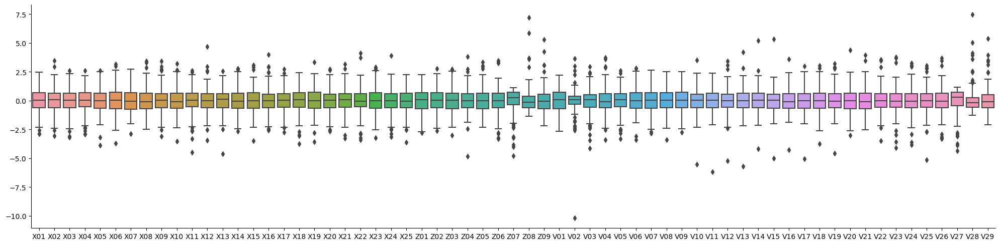

In [44]:
# Display the standardized input data as a box plot
sns.catplot(data = Xinput_df, kind='box', aspect=4)

plt.show()

### Inverse Transformation

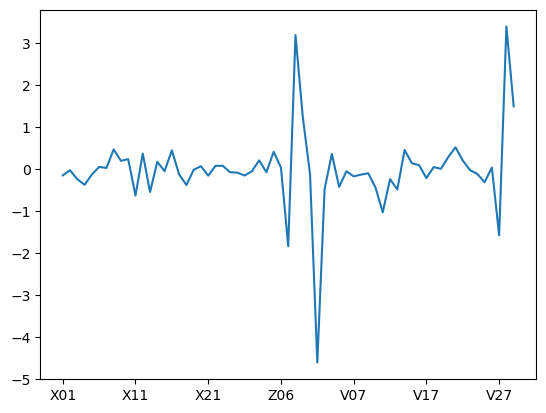

In [45]:
# Calculate and plot the skew for all input variables
fig, ax = plt.subplots()

df.drop(columns=['Y']).skew().plot(ax=ax)

plt.show()

In [46]:
# Create an object of variable names with positive skew (> 1)
high_skew_inputs = input_names[ np.abs(df.drop(columns=['Y']).skew()) > 1 ]
high_skew_inputs

Index(['Z07', 'Z08', 'Z09', 'V02', 'V11', 'V27', 'V28', 'V29'], dtype='object')

In [47]:
# Get the high skew input data
lf_skew = lf.loc[ lf.variable.isin(high_skew_inputs), :].copy()
lf_skew = lf_skew.loc[ ~lf_skew.variable.isin(['V02', 'V11', 'V29', 'Z09']), :].copy()

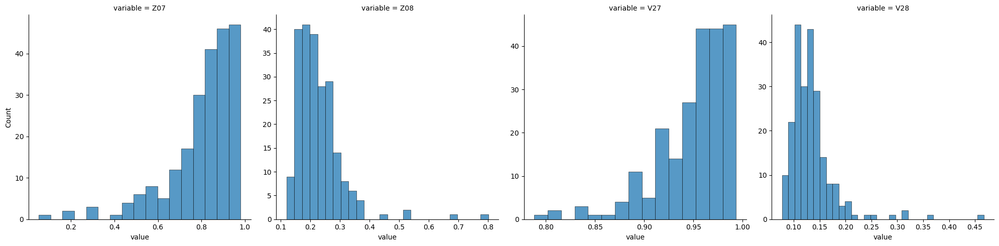

In [48]:
# Visualize just the positive high skew variables
sns.displot(data = lf_skew, 
            x='value', col='variable', kind='hist', col_wrap=4,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False)

plt.show()

In [49]:
# Apply the inverse transformation
lf_skew['inverse_value'] = 1 / lf_skew.value

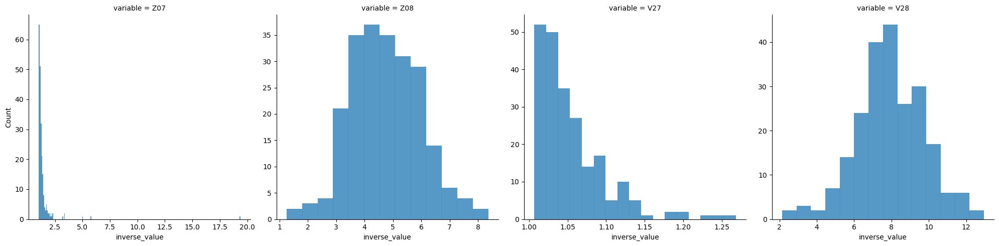

In [50]:
# Visualize the transformed variables
sns.displot(data = lf_skew, 
            x='inverse_value', col='variable', kind='hist', col_wrap=4,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False)

plt.show()

The `inverse transformation` helped to fix the skew in variables `Z08` and `V28`, but not in `Z07` or `V27`.

In [51]:
# Create a copy of the standardized input data to transform
Xinput_df_trans = Xinput_df.copy()

In [52]:
# Define transformation function
def inverse_trans(x):
    return 1/x

In [53]:
# Tranform the skewed inputs in dataframe to be used later
Xinput_df_trans['Z07'] = Xinput_df_trans['Z07'].apply(inverse_trans)
Xinput_df_trans['Z08'] = Xinput_df_trans['Z08'].apply(inverse_trans)
Xinput_df_trans['V27'] = Xinput_df_trans['V27'].apply(inverse_trans)
Xinput_df_trans['V28'] = Xinput_df_trans['V28'].apply(inverse_trans)

#### Cluster with original inputs and PCA
EDA revealed that the continuous inputs are highly correlated. We will therefore cluster with the original variables, as well as with PCA.

### Heirarchical Clustering
Determine the optimal number of clusters for the input data.

In [54]:
# Heirarchical clustering with complete linkage
hclust_complete = hierarchy.complete(Xinput)

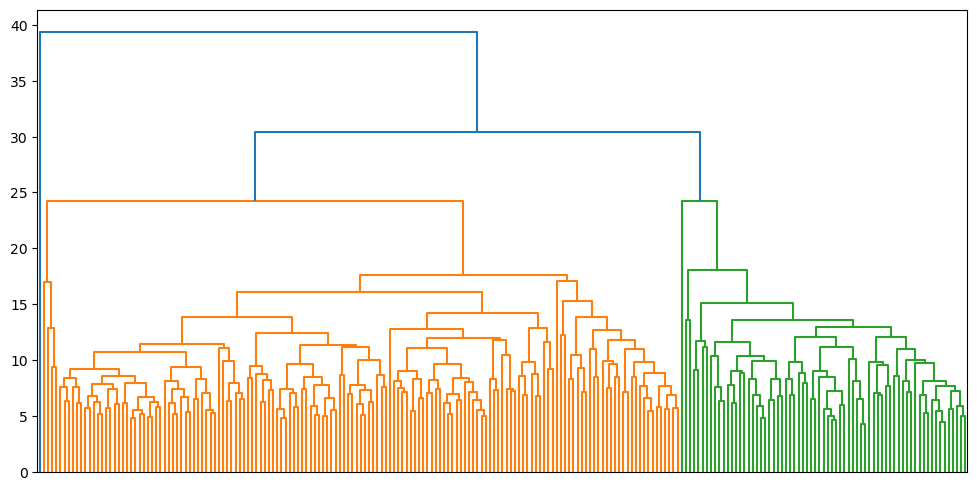

In [55]:
# Visualize the resulting dendrogram clusters
fig = plt.figure(figsize=(12, 6))

dn = hierarchy.dendrogram(hclust_complete, no_labels=True)

plt.show()

By using heirarchical clustering with complete linkage, we determined that the orginal inputs were optimally separated into `2` distinct clusters. This clustering approach aligned with the knee bend plot in the supporting cluster document. This may be correlated to the fact that the output variable `Y` is binary and has two possible values.

### KMeans: 2 Clusters

In [56]:
# Fit, predict, and transform
km2 = KMeans(n_clusters=2, random_state=140, n_init=25, max_iter=500).fit_predict(Xinput)

In [57]:
# Create a copy of the original input data set
df_inputs_copy = df_inputs.copy()

In [58]:
# Add a column `k2` to store the result of the KMeans cluster labels
df_inputs_copy['k2'] = pd.Series(km2, index=df_inputs_copy.index)

In [59]:
# Display the number of observations per `k2` cluster
df_inputs_copy['k2'] = df_inputs_copy.k2.astype('category')
df_inputs_copy.k2.value_counts()

k2
0    116
1    107
Name: count, dtype: int64

The resulting `k2` clusters are generally balanced with a similiar number of observations in each.

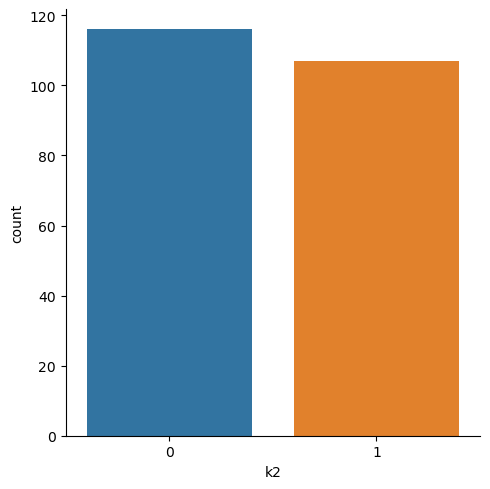

In [60]:
# Visualize the number of observations per cluster using a count plot
sns.catplot(data=df_inputs_copy, x='k2', kind='count')

plt.show()

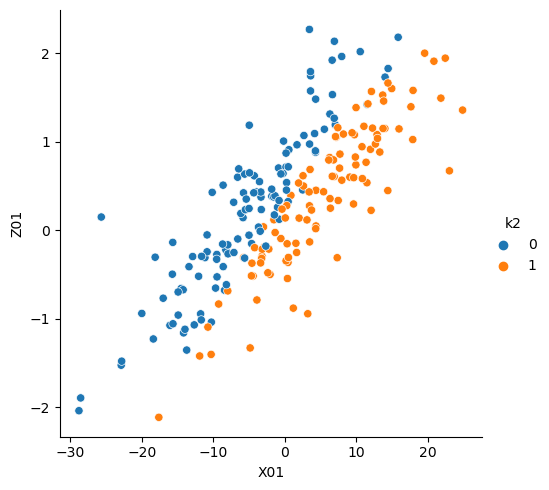

In [61]:
# Visualize the cluster results between 2 of the variables
sns.relplot(data = df_inputs_copy, x='X01', y='Z01', hue='k2')

plt.show()

In [62]:
# Add the original output categories
df_inputs_copy['Y'] = df.Y

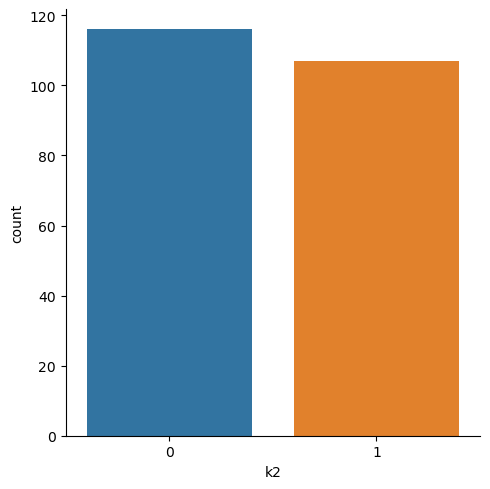

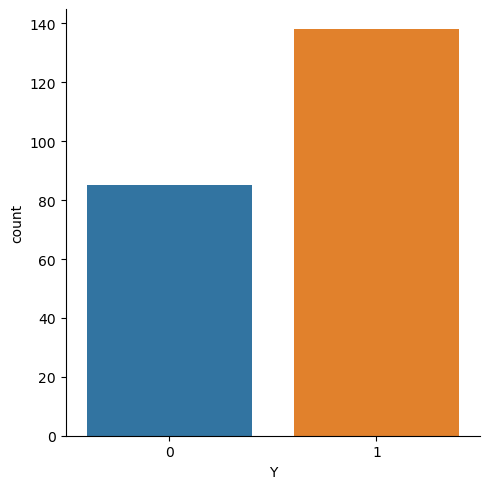

In [63]:
# Compare the `k2` results to the original output category
sns.catplot(data=df_inputs_copy, x='k2', kind='count')
sns.catplot(data=df_inputs_copy, x='Y', kind='count')

plt.show()

In [64]:
# Melt the cluster results for easier visualizations
lf_inputs_copy = df_inputs_copy.copy().\
reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid', 'Y', 'k2'], value_vars=input_names, ignore_index=True)
lf_inputs_copy

,rowid,Y,k2,variable,value
0,0,1,1,X01,-2.907070
1,1,1,1,X01,-4.608052
2,2,1,1,X01,4.338816
3,3,0,0,X01,-1.835062
4,4,1,0,X01,13.990969
...,...,...,...,...,...
14044,218,0,0,V29,-100.512718
14045,219,1,1,V29,-118.299085
14046,220,1,0,V29,-102.237684
14047,221,1,0,V29,-119.015441


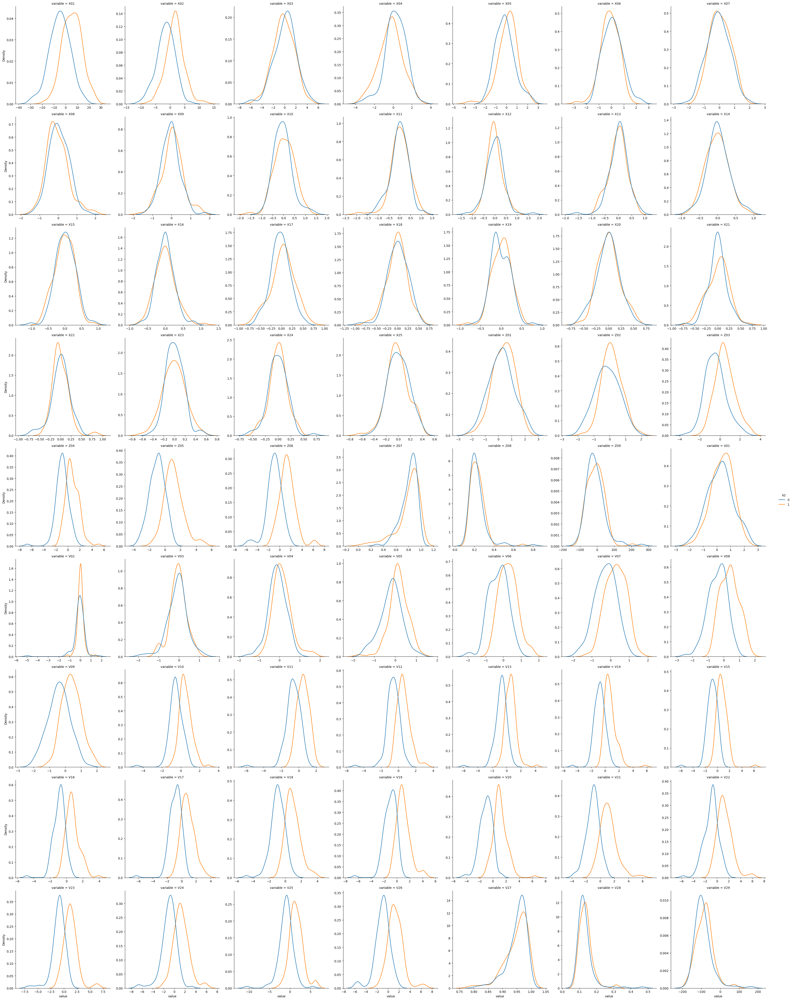

In [65]:
# Visualize the conditional distributions for the input variables colored by cluster
sns.displot(data=lf_inputs_copy, x='value', col='variable', hue='k2', kind='kde',\
col_wrap=7, facet_kws={'sharex': False, 'sharey': False},\
common_norm=False)

plt.show()

### KMeans: PCA

In [66]:
# Fit and transform the data with PCA
input_pca = PCA(n_components=2).fit_transform(Xinput)

In [67]:
# Display the shape before and after PCA
print(Xinput.shape)
print(input_pca.shape)

(223, 63)
(223, 2)


In [68]:
# DataFrame to hold new PCA variables
input_pca_df = pd.DataFrame(input_pca, columns=['pc01', 'pc02'])

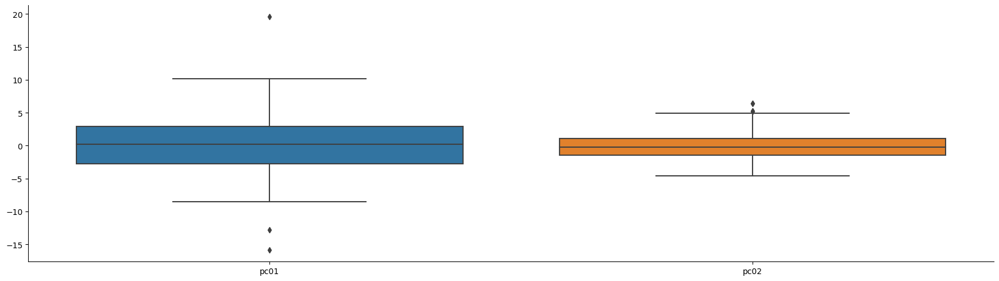

In [69]:
# Visualize the principal components using a box plot
sns.catplot(data = input_pca_df, kind='box', aspect=3.5)

plt.show()

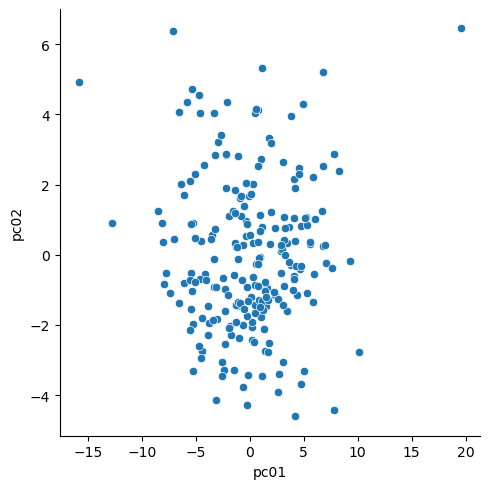

In [70]:
# Visualize the relationship between the PCA variables
sns.relplot(data = input_pca_df, x='pc01', y='pc02')

plt.show()

In [71]:
# Fit, predict, and transform
clusters_2 = KMeans(n_clusters=2, random_state=121, n_init=25, max_iter=500).fit_predict(Xinput)

In [72]:
# Add a column `k2` to the PCA table to store the KMeans cluster labels
input_pca_df['k2'] = pd.Series( clusters_2, index=input_pca_df.index ).astype('category')

In [73]:
# Add a column `Y` for the original output categories
input_pca_df_copy = input_pca_df.copy()
input_pca_df_copy['Y'] = df.Y
input_pca_df_copy

,pc01,pc02,k2,Y
0,-0.807407,-1.446378,0,1
1,-4.174854,-0.538055,0,1
2,-4.645541,4.032124,0,1
3,0.955849,-0.073032,1,0
4,1.109275,0.796159,1,1
...,...,...,...,...
218,1.519929,-1.199317,1,0
219,-3.871579,-1.462739,0,1
220,2.873937,0.290372,1,1
221,0.345705,-2.490472,1,1


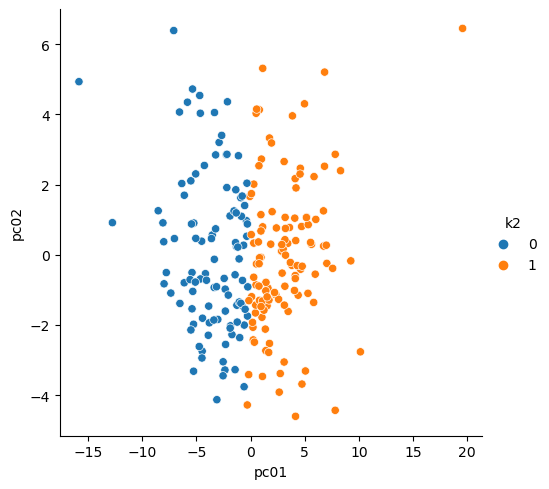

In [74]:
# Visualize the relationship between the PCA variables grouped by `k2`
sns.relplot(data = input_pca_df, x='pc01', y='pc02', hue='k2')

plt.show()

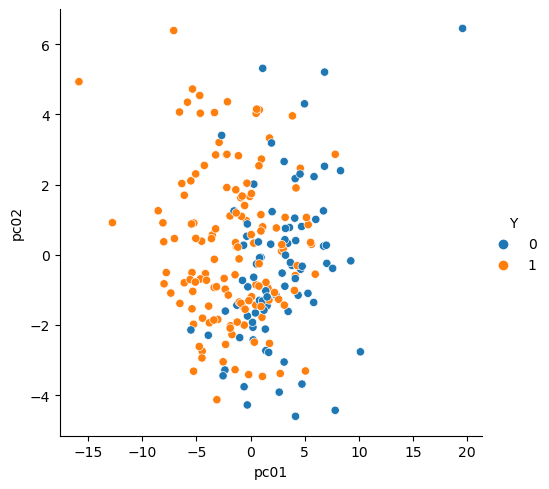

In [75]:
# Compare the cluster assignments to the original output values
sns.relplot(data = input_pca_df_copy, x='pc01', y='pc02', hue='Y')

plt.show()

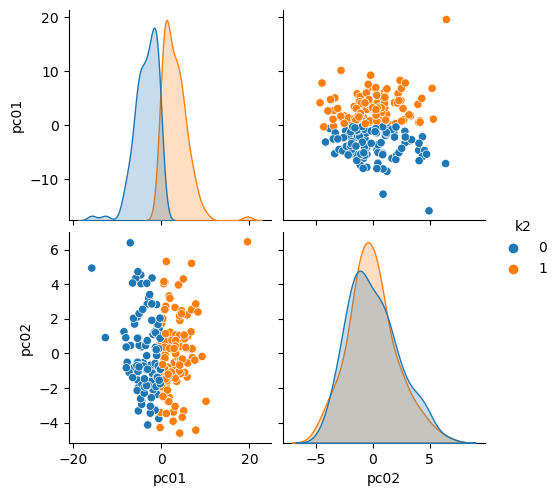

In [76]:
# Visualize the relationship between the 2 new variables with a pair plot grouped by `k2`
sns.pairplot(data = input_pca_df_copy.drop(columns=['Y']), hue='k2', diag_kws={'common_norm': False})

plt.show()

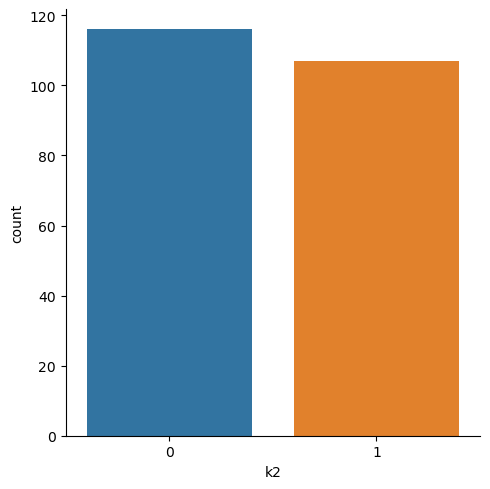

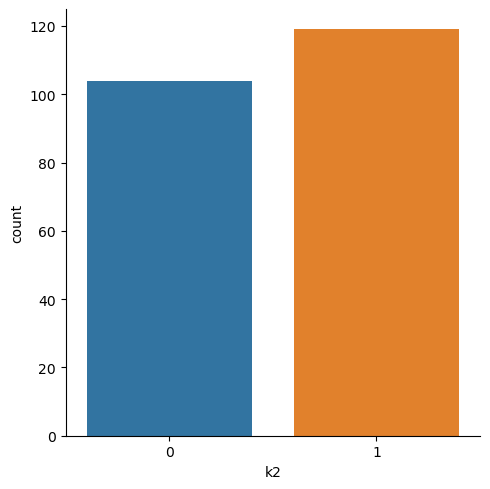

In [77]:
# Compare the cluster assignments between the original variables and the PC scores.
sns.catplot(data=df_inputs_copy, x='k2', kind='count')
sns.catplot(data=input_pca_df, x='k2', kind='count')

plt.show()

## D. Models: Fitting & Interpretation

The data tells us that the event failure occurs approximately 62% of the time. Therefore, our models will need to do better than 62% accuracy in order for it to predict better than a random guess.

In [78]:
# Display the proportion of events
df.Y.value_counts(normalize=True)

Y
1    0.618834
0    0.381166
Name: proportion, dtype: float64

### Functions for Interpreting Models

In [79]:
# Define a function that fits and calculates the training set performance for any formula
def fit_and_assess_logistic(mod_name, a_formula, train_data, threshold):
    a_mod = smf.logit(formula=a_formula, data=train_data).fit()
    
    train_copy = train_data.copy()
    
    train_copy['pred_probability'] = a_mod.predict( train_data )
    
    train_copy['pred_class'] = np.where( train_copy.pred_probability > threshold, 1, 0 )
    
    TN, FP, FN, TP = confusion_matrix( train_copy.y.to_numpy(), train_copy.pred_class.to_numpy() ).ravel()
    
    Accuracy = (TN + TP) / (TN + FP + FN + TP)
    
    Sensitivity = (TP) / (TP + FN)
    
    Specificity = (TN) / (TN + FP)
    
    FPR = 1 - Specificity
    
    ROC_AUC = roc_auc_score( train_copy.y.to_numpy(), train_copy.pred_probability.to_numpy() )
    
    res_dict = {'model_name': mod_name,
                'model_formula': a_formula,
                'num_coefs': len( a_mod.params ),
                'threshold': threshold,
                'Accuracy': Accuracy,
                'Sensitivity': Sensitivity,
                'Specificity': Specificity,
                'FPR': FPR,
                'ROC_AUC': ROC_AUC}
    
    return pd.DataFrame( res_dict, index=[0] )

In [80]:
# Define a function that returns the complete ROC curve for each model
def fit_logistic_make_roc(mod_name, a_formula, train_data):
    a_mod = smf.logit(formula=a_formula, data=train_data).fit()
    
    train_copy = train_data.copy()
    
    train_copy['pred_probability'] = a_mod.predict( train_data )
    
    fpr, tpr, threshold = roc_curve( train_data.y.to_numpy(), train_copy.pred_probability.to_numpy() )
    
    res_df = pd.DataFrame({'tpr': tpr,
                           'fpr': fpr,
                           'threshold': threshold})
    
    res_df['model_name'] = mod_name
    res_df['model_formula'] = a_formula
    
    return res_df

In [81]:
# Define a function that displays a coefficient plot given a particular model
def my_coefplot(mod, figsize_use=(15, 10)):
    fig, ax = plt.subplots(figsize=figsize_use)
    
    ax.errorbar( y=mod.params.index,
                 x=mod.params,
                 xerr = 2 * mod.bse,
                 fmt='o', color='k', ecolor='k', elinewidth=2, ms=10)
    
    ax.axvline(x=0, linestyle='--', linewidth=3.5, color='grey')
    
    ax.set_xlabel('coefficient value')
    
    plt.show()

### Fitting Logistic Regression Models

In [82]:
# Add output column to the standardized data frames for model fitting
Xinput_df['y'] = df.Y
Xinput_df_trans['y'] = df.Y

In [83]:
# Lists to hold performance results
results_list = []

In [84]:
roc_list = []

In [173]:
# Create a copy of the original, transformed, and pca data sets for visualizing the confusin matrix
Xinput_df_copy = Xinput_df.copy()

In [174]:
Xinput_df_trans_copy = Xinput_df_trans.copy()

In [188]:
input_pca_df_copy = input_pca_df.copy()

In [176]:
input_pca_trans_df_copy = input_pca_trans_df.copy()

#### Model 1

In [85]:
# Model 1: Constant
results_list.append(fit_and_assess_logistic(1, 'y ~ 1', train_data=Xinput_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(1, 'y ~ 1', train_data=Xinput_df))

Optimization terminated successfully.
         Current function value: 0.664632
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.664632
         Iterations 4


In [86]:
# Display the coefficent values and which are statistically significnat
fit_1 = smf.logit(formula='y ~ 1', data=Xinput_df).fit()

fit_1.params

Optimization terminated successfully.
         Current function value: 0.664632
         Iterations 4


Intercept    0.484602
dtype: float64

In [87]:
fit_1.pvalues > 0.05

Intercept    False
dtype: bool

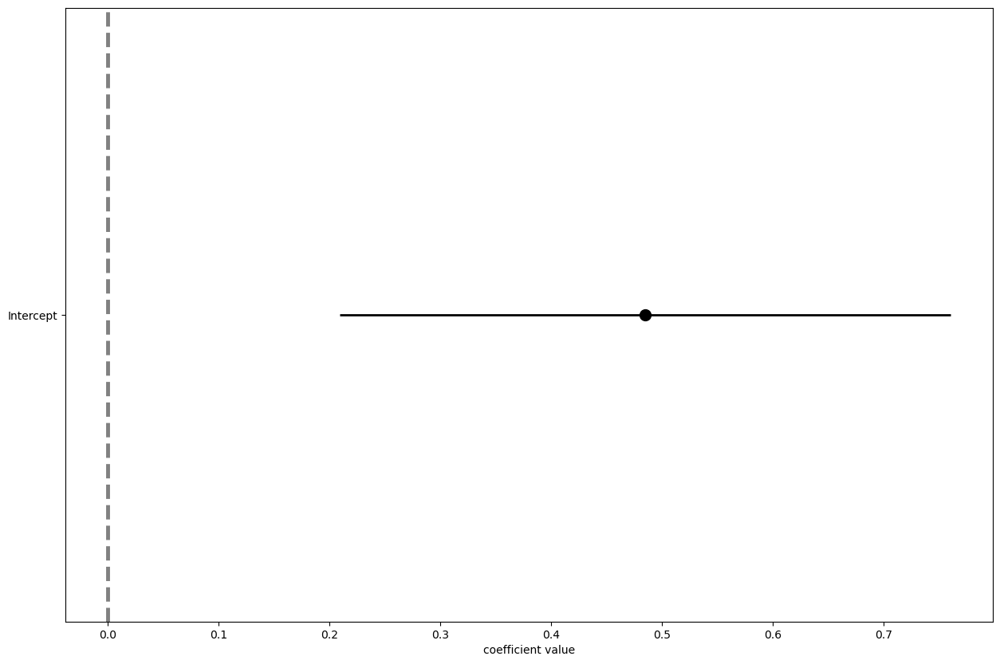

In [88]:
my_coefplot(fit_1)

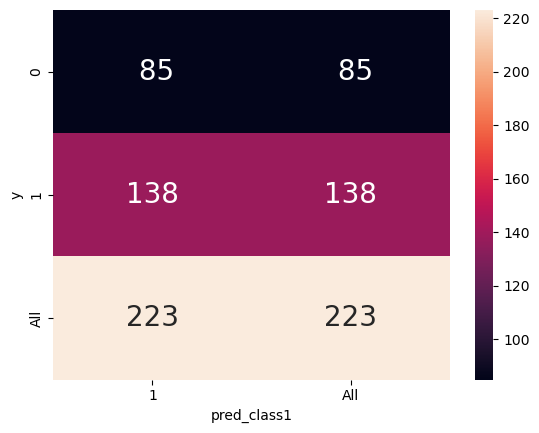

In [203]:
# Predict and classify the training set with a 0.5 threshold
Xinput_df_copy['pred_probability1'] = fit_1.predict(Xinput_df)
Xinput_df_copy['pred_class1'] = np.where(Xinput_df_copy.pred_probability1 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(Xinput_df_copy.y, Xinput_df_copy.pred_class1, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 2

In [89]:
# Model 2: Linear additive features using the original inputs
formula_2 = 'y ~ '+' + '.join(df_inputs.columns[:])
results_list.append(fit_and_assess_logistic(2, formula_2, train_data=Xinput_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(2, formula_2, train_data=Xinput_df))

Optimization terminated successfully.
         Current function value: 0.286345
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.286345
         Iterations 9


In [90]:
# Display the coefficent values and which are statistically significnat
fit_2 = smf.logit(formula=formula_2, data=Xinput_df).fit()

fit_2.params.to_numpy()

Optimization terminated successfully.
         Current function value: 0.286345
         Iterations 9


array([ 1.35811498e+00, -5.05312545e+00,  6.81692855e+00,  1.40345425e+00,
        1.00055964e+00,  4.25338217e-01, -1.90351272e+00, -4.77227402e-01,
       -1.27716462e+00,  4.74092008e-04,  5.49790978e-01, -7.97325992e-02,
       -1.10804577e-01,  1.13602656e+00,  5.18557020e-01, -4.71345456e-01,
        9.11901618e-01,  4.46125309e-01,  2.86241196e-01, -5.37418952e-01,
        1.29766348e-01, -1.24212505e-02,  3.85361090e-01, -3.81638488e-02,
        5.12139985e-01,  8.59990047e-01,  3.35855807e+00,  7.45157662e-01,
        2.91030339e+00,  2.95981201e+00, -5.33750615e-01, -8.53495320e+00,
        1.35219867e+00,  1.80064223e+00, -1.06889707e+00,  5.66898777e+00,
       -6.50153217e-01,  4.77401877e-01,  3.81728752e-01, -1.39069227e+00,
        7.42915701e-01,  3.48292156e+00,  1.21940048e+00,  1.03547955e+00,
       -8.44585546e-01,  3.30330777e-01, -3.83489073e-01,  1.28617829e+00,
       -2.26406730e+00, -3.42074257e+00, -1.53595059e+00, -1.43274962e+00,
       -8.85159430e-01,  

In [91]:
fit_2.pvalues > 0.05

Intercept    False
X01           True
X02           True
X03           True
X04           True
             ...  
V25           True
V26           True
V27           True
V28           True
V29           True
Length: 64, dtype: bool

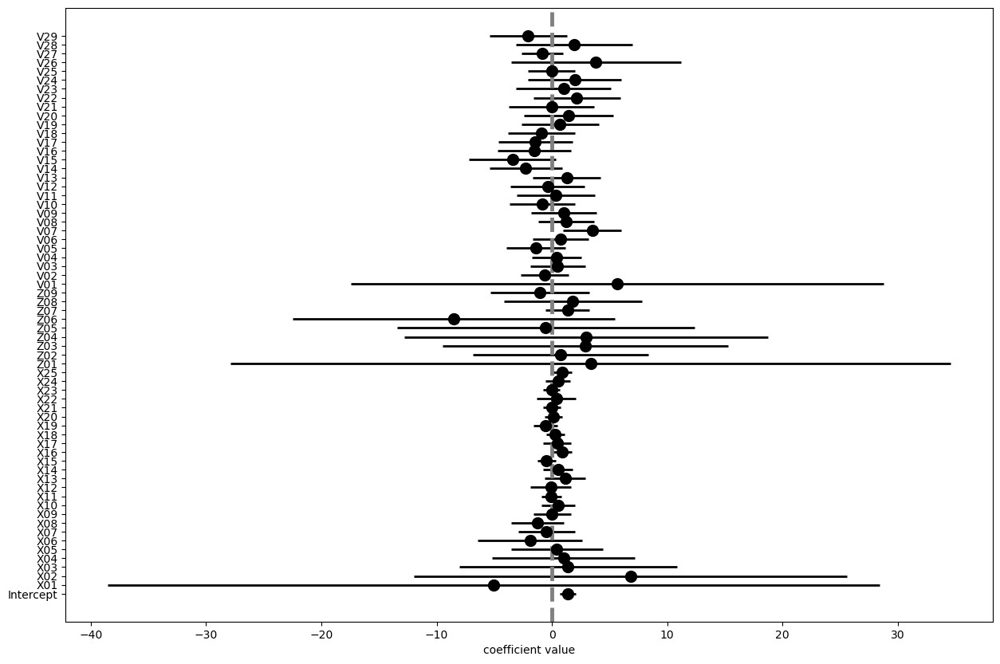

In [92]:
my_coefplot(fit_2)

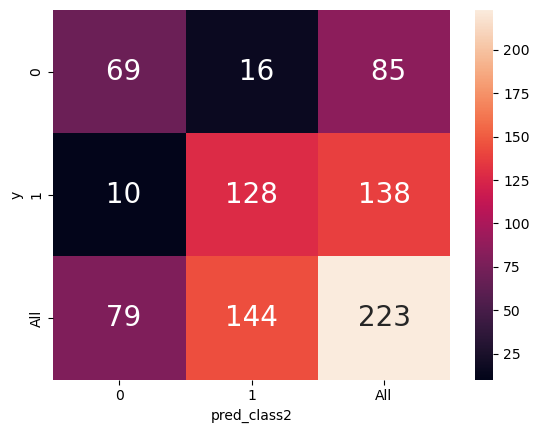

In [202]:
# Predict and classify the training set with a 0.5 threshold
Xinput_df_copy['pred_probability2'] = fit_2.predict(Xinput_df)
Xinput_df_copy['pred_class2'] = np.where(Xinput_df_copy.pred_probability2 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(Xinput_df_copy.y, Xinput_df_copy.pred_class2, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 3

In [93]:
# Model 3: Linear additive features based on transformed inputs
formula_3 = 'y ~ '+' + '.join(df_inputs.columns[:])
results_list.append(fit_and_assess_logistic(3, formula_3, train_data=Xinput_df_trans, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(3, formula_3, train_data=Xinput_df_trans))

Optimization terminated successfully.
         Current function value: 0.291294
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.291294
         Iterations 11


In [94]:
# Display the coefficent values and which are statistically significnat
fit_3 = smf.logit(formula=formula_3, data=Xinput_df_trans).fit()

fit_3.params.to_numpy()

Optimization terminated successfully.
         Current function value: 0.291294
         Iterations 11


array([ 9.93878627e-01, -5.74471827e-01,  4.97466547e+00,  2.02565135e+00,
        1.25576379e+00, -8.23490846e-01, -1.15986552e+00, -1.59054794e+00,
       -1.36311669e+00, -5.58640695e-01,  3.43187340e-01, -2.32908822e-01,
        2.88029638e-01,  9.78652085e-01,  5.02267386e-01, -4.23316305e-01,
        7.82563295e-01,  5.88311815e-01,  3.28306139e-01, -3.19740723e-01,
        2.51035493e-01,  1.23544519e-01,  6.07582333e-01,  2.03109800e-02,
        6.58669829e-01,  9.19691397e-01,  7.29458472e-01,  1.11149958e+00,
        2.80378932e+00,  2.80397026e+00,  1.25304910e+00, -1.15192845e+01,
        4.02602407e-02, -9.20296859e-03, -5.64587014e-01,  3.49018366e+00,
       -1.52184016e+00,  8.35376862e-02,  3.33434726e-01, -7.09978365e-01,
        6.33384637e-01,  2.51103248e+00,  1.01877138e+00,  4.03544118e-01,
       -1.00725459e+00,  6.73847813e-01, -1.51022636e-01,  1.57377791e-01,
       -1.56925302e+00, -1.72014241e+00, -1.85916573e+00, -1.60658028e+00,
       -6.22425028e-01,  

In [95]:
fit_3.pvalues > 0.05

Intercept    False
X01           True
X02           True
X03           True
X04           True
             ...  
V25           True
V26           True
V27           True
V28           True
V29           True
Length: 64, dtype: bool

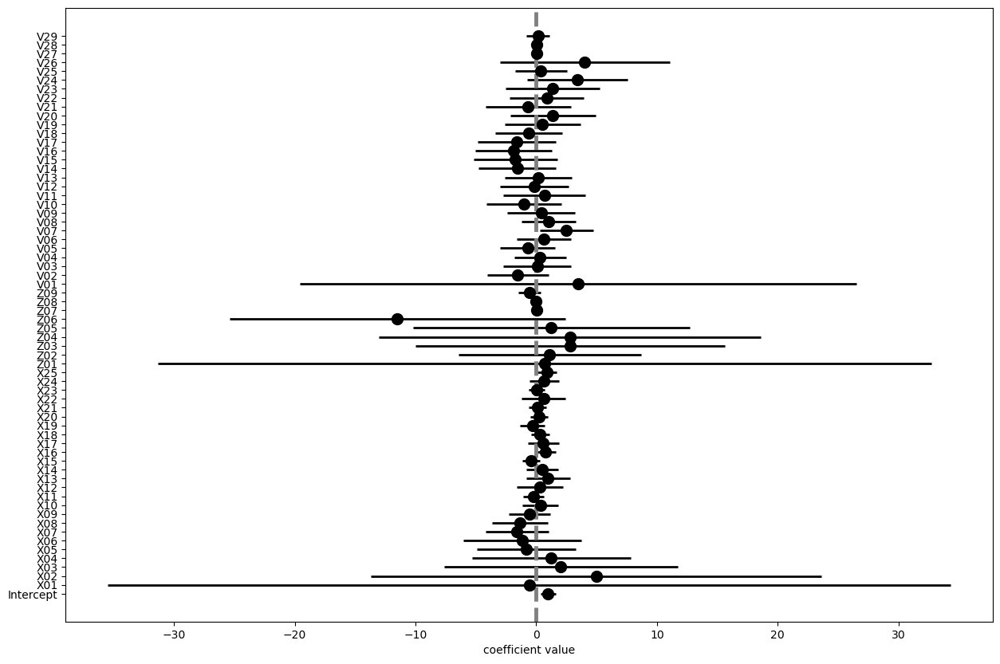

In [96]:
my_coefplot(fit_3)

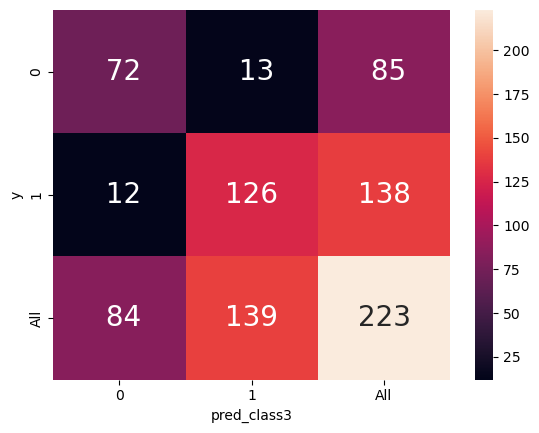

In [201]:
# Predict and classify the training set with a 0.5 threshold
Xinput_df_trans_copy['pred_probability3'] = fit_3.predict(Xinput_df_trans)
Xinput_df_trans_copy['pred_class3'] = np.where(Xinput_df_trans_copy.pred_probability3 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(Xinput_df_trans_copy.y, Xinput_df_trans_copy.pred_class3, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 4

In [97]:
input_pca_df['y'] = df.Y

In [98]:
# Model 4: Apply PCA to the original inputs and create linear additive features from the PCs
results_list.append(fit_and_assess_logistic(4, 'y ~ pc01 + pc02', train_data=input_pca_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(4, 'y ~ pc01 + pc02', train_data=input_pca_df))

Optimization terminated successfully.
         Current function value: 0.500247
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.500247
         Iterations 6


In [99]:
# Display the coefficent values and which are statistically significnat
fit_4 = smf.logit(formula='y ~ pc01 + pc02', data=input_pca_df).fit()

fit_4.params

Optimization terminated successfully.
         Current function value: 0.500247
         Iterations 6


Intercept    0.739488
pc01        -0.370170
pc02         0.216937
dtype: float64

In [100]:
fit_4.pvalues > 0.05

Intercept    False
pc01         False
pc02         False
dtype: bool

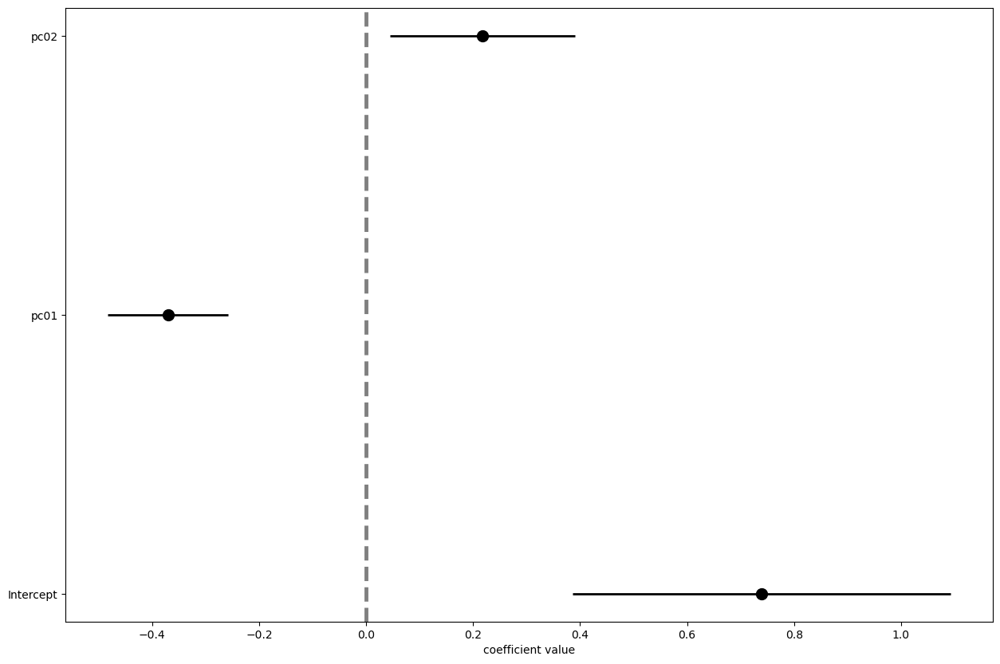

In [101]:
my_coefplot(fit_4)

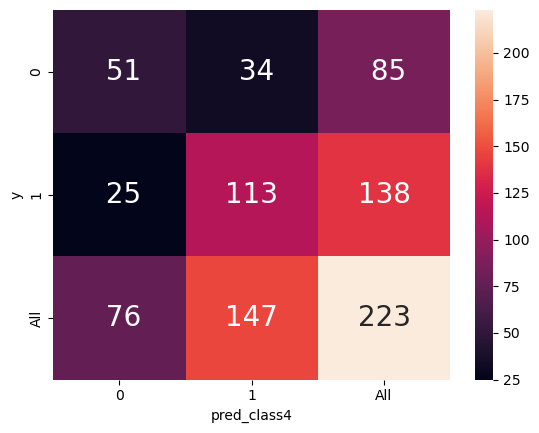

In [200]:
# Predict and classify the training set with a 0.5 threshold
input_pca_df_copy['pred_probability4'] = fit_4.predict(input_pca_df)
input_pca_df_copy['pred_class4'] = np.where(input_pca_df_copy.pred_probability4 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(input_pca_df_copy.y, input_pca_df_copy.pred_class4, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 5

In [102]:
# Model 5: Apply PCA to the transformed inputs and create linear additive features from the PCs
input_pca_trans = PCA(n_components=2).fit_transform(Xinput_df_trans)
input_pca_trans_df = pd.DataFrame(input_pca_trans, columns=['pc01', 'pc02'])
input_pca_trans_df['y'] = df.Y

results_list.append(fit_and_assess_logistic(5, 'y ~ pc01 + pc02', train_data=input_pca_trans_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(5, 'y ~ pc01 + pc02', train_data=input_pca_trans_df))

Optimization terminated successfully.
         Current function value: 0.655265
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.655265
         Iterations 10


In [103]:
# Display the coefficent values and which are statistically significnat
fit_5 = smf.logit(formula='y ~ pc01 + pc02', data=input_pca_trans_df).fit()

fit_5.params

Optimization terminated successfully.
         Current function value: 0.655265
         Iterations 10


Intercept    0.551451
pc01         0.010283
pc02         0.005593
dtype: float64

In [104]:
fit_5.pvalues > 0.05

Intercept    False
pc01          True
pc02          True
dtype: bool

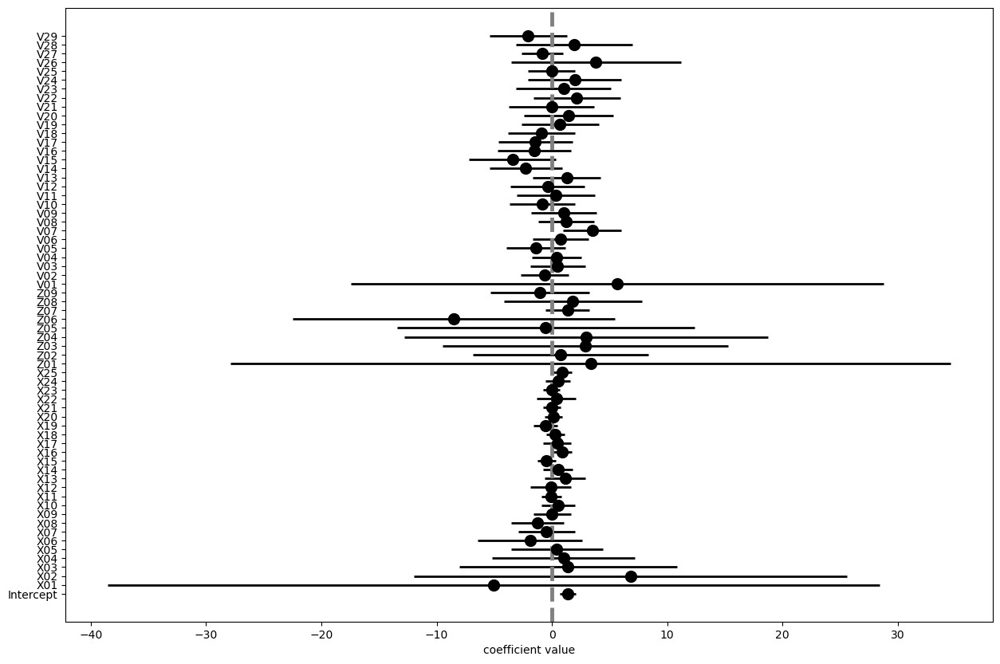

In [105]:
my_coefplot(fit_2)

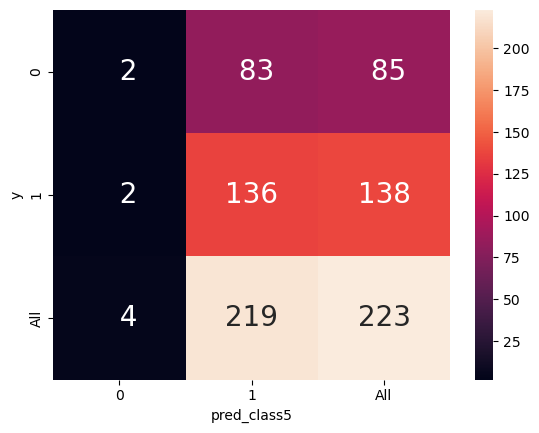

In [199]:
# Predict and classify the training set with a 0.5 threshold
input_pca_trans_df_copy['pred_probability5'] = fit_5.predict(input_pca_trans_df)
input_pca_trans_df_copy['pred_class5'] = np.where(input_pca_trans_df_copy.pred_probability5 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(input_pca_trans_df_copy.y, input_pca_trans_df_copy.pred_class5, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 6

In [106]:
# Model 6: Apply PCA to the original inputs and create all pairwise interactions between the PCs
results_list.append(fit_and_assess_logistic(6, 'y ~ (pc01 + pc02) **2', train_data=input_pca_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(6, 'y ~ (pc01 + pc02) **2', train_data=input_pca_df))

Optimization terminated successfully.
         Current function value: 0.498681
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.498681
         Iterations 7


In [107]:
# Display the coefficent values and which are statistically significant
fit_6 = smf.logit(formula='y ~ (pc01 + pc02) **2', data=input_pca_df).fit()

fit_6.params

Optimization terminated successfully.
         Current function value: 0.498681
         Iterations 7


Intercept    0.776839
pc01        -0.373151
pc02         0.240808
pc01:pc02   -0.022515
dtype: float64

In [108]:
fit_6.pvalues > 0.05

Intercept    False
pc01         False
pc02         False
pc01:pc02     True
dtype: bool

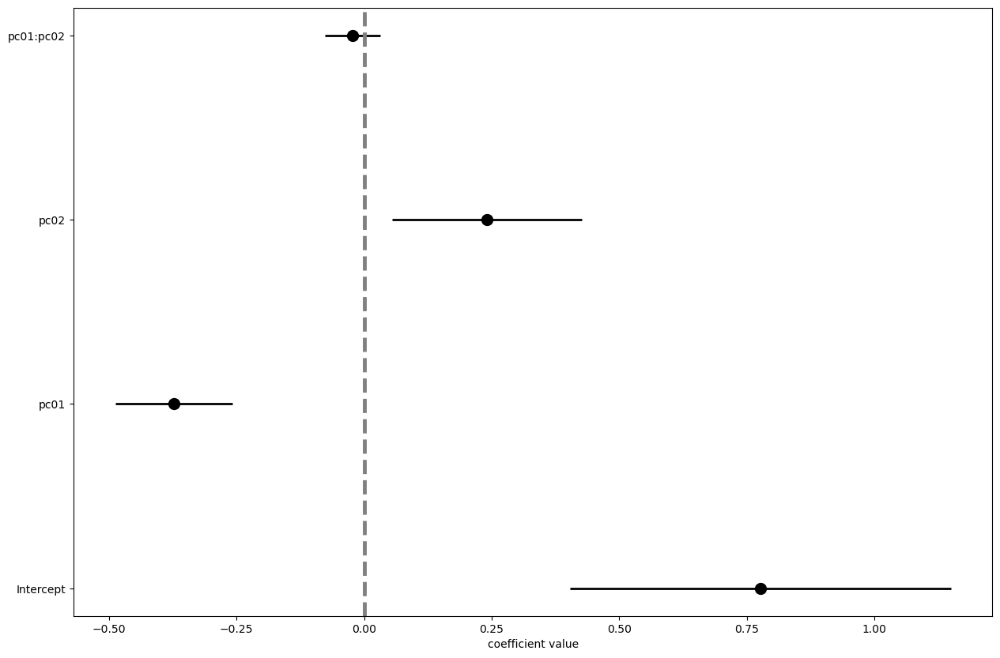

In [109]:
my_coefplot(fit_6)

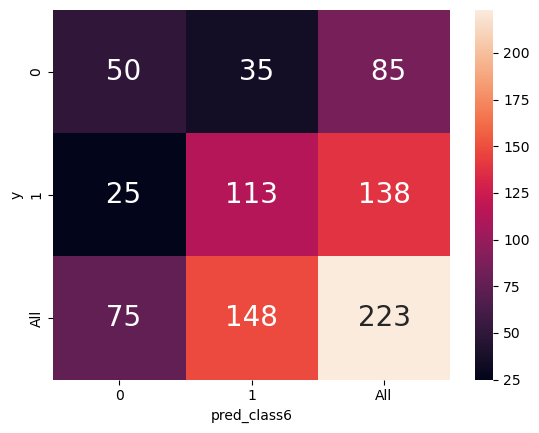

In [198]:
# Predict and classify the training set with a 0.5 threshold
input_pca_df_copy['pred_probability6'] = fit_6.predict(input_pca_df)
input_pca_df_copy['pred_class6'] = np.where(input_pca_df_copy.pred_probability6 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(input_pca_df_copy.y, input_pca_df_copy.pred_class6, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 7

In [110]:
# Model 7: Apply PCA to the transformed inputs and create all pairwise interactions between the PCs
results_list.append(fit_and_assess_logistic(7, 'y ~ (pc01 + pc02) **2', train_data=input_pca_trans_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(7, 'y ~ (pc01 + pc02) **2', train_data=input_pca_trans_df))

Optimization terminated successfully.
         Current function value: 0.655007
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.655007
         Iterations 10


In [111]:
# Display the coefficent values and which are statistically significant
fit_7 = smf.logit(formula='y ~ (pc01 + pc02) **2', data=input_pca_trans_df).fit()

fit_7.params

Optimization terminated successfully.
         Current function value: 0.655007
         Iterations 10


Intercept    0.543325
pc01         0.009163
pc02         0.002242
pc01:pc02   -0.000603
dtype: float64

In [112]:
fit_7.pvalues > 0.05

Intercept    False
pc01          True
pc02          True
pc01:pc02     True
dtype: bool

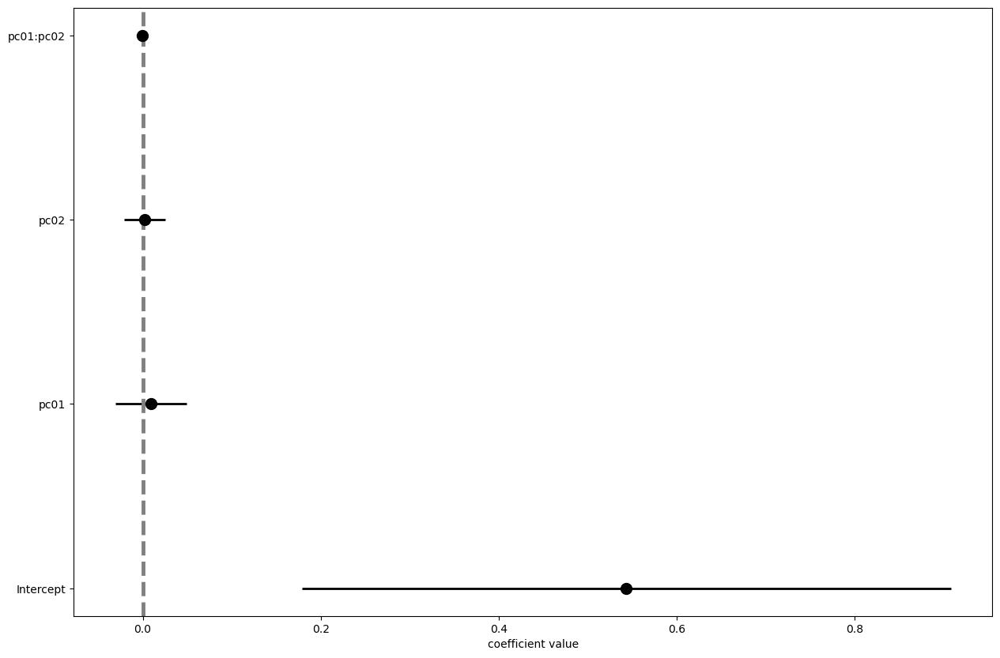

In [113]:
my_coefplot(fit_7)

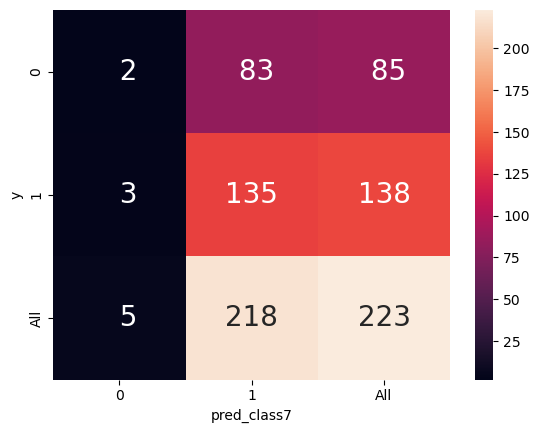

In [197]:
# Predict and classify the training set with a 0.5 threshold
input_pca_trans_df_copy['pred_probability7'] = fit_7.predict(input_pca_trans_df)
input_pca_trans_df_copy['pred_class7'] = np.where(input_pca_trans_df_copy.pred_probability7 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(input_pca_trans_df_copy.y, input_pca_trans_df_copy.pred_class7, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 8

In [114]:
# Model 8: Apply PCA to the original inputs and create features from the PCs
results_list.append(fit_and_assess_logistic(8, 'y ~ (pc01 + pc02)**3', train_data=input_pca_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(8, 'y ~ (pc01 + pc02)**3', train_data=input_pca_df))

Optimization terminated successfully.
         Current function value: 0.498681
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.498681
         Iterations 7


In [115]:
# Display the coefficent values and which are statistically significant
fit_8 = smf.logit(formula='y ~ (pc01 + pc02)**3', data=input_pca_df).fit()

fit_8.params

Optimization terminated successfully.
         Current function value: 0.498681
         Iterations 7


Intercept    0.776839
pc01        -0.373151
pc02         0.240808
pc01:pc02   -0.022515
dtype: float64

In [116]:
fit_8.pvalues > 0.05

Intercept    False
pc01         False
pc02         False
pc01:pc02     True
dtype: bool

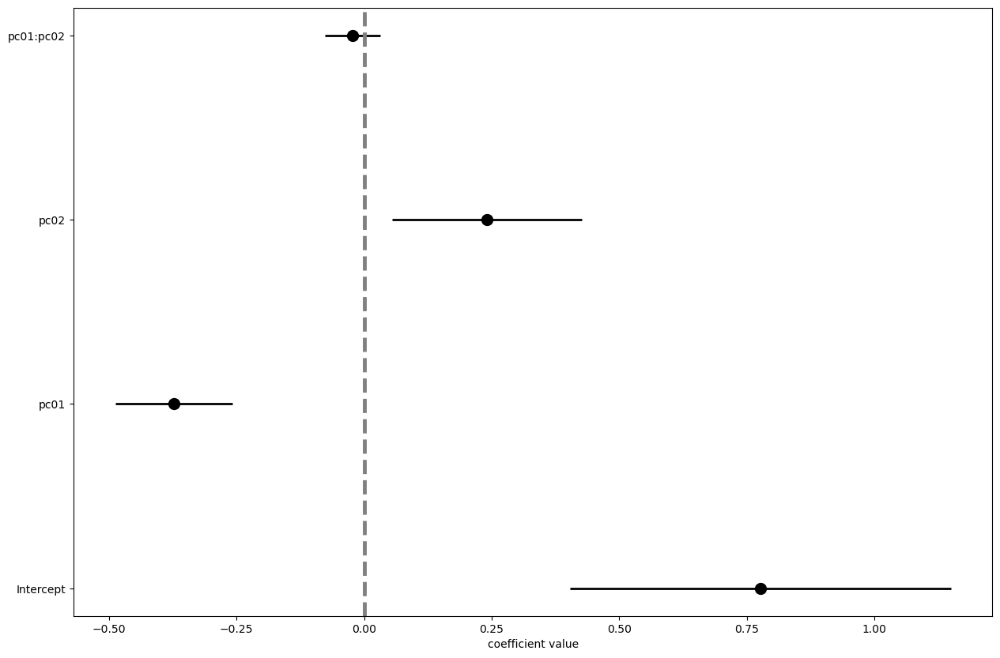

In [117]:
my_coefplot(fit_8)

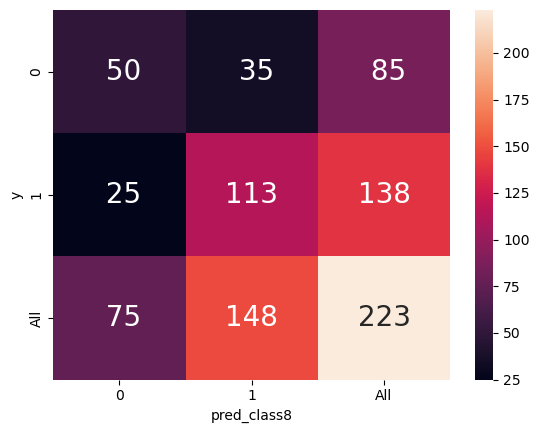

In [195]:
#Predict and classify the training set with a 0.5 threshold
input_pca_df_copy['pred_probability8'] = fit_6.predict(input_pca_df)
input_pca_df_copy['pred_class8'] = np.where(input_pca_df_copy.pred_probability8 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(input_pca_df_copy.y, input_pca_df_copy.pred_class8, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

#### Model 9

In [118]:
# Model 9: Apply PCA to the original inputs and create features from the PCs
results_list.append(fit_and_assess_logistic(9, 'y ~ pc01 + pc02 + np.power(pc01,2) + np.power(pc02,2)', train_data=input_pca_df, threshold=0.5))

# Add results to roc_list for visualization
roc_list.append(fit_logistic_make_roc(9, 'y ~ pc01 + pc02 + np.power(pc01,2) + np.power(pc02,2)', train_data=input_pca_df))

Optimization terminated successfully.
         Current function value: 0.495437
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.495437
         Iterations 7


In [119]:
# Display the coefficent values and which are statistically significant
fit_9 = smf.logit(formula='y ~ pc01 + pc02 + np.power(pc01,2) + np.power(pc02,2)', data=input_pca_df).fit()

fit_9.params

Optimization terminated successfully.
         Current function value: 0.495437
         Iterations 7


Intercept            0.794489
pc01                -0.404090
pc02                 0.221315
np.power(pc01, 2)    0.012089
np.power(pc02, 2)   -0.035135
dtype: float64

In [120]:
fit_9.pvalues > 0.05

Intercept            False
pc01                 False
pc02                 False
np.power(pc01, 2)     True
np.power(pc02, 2)     True
dtype: bool

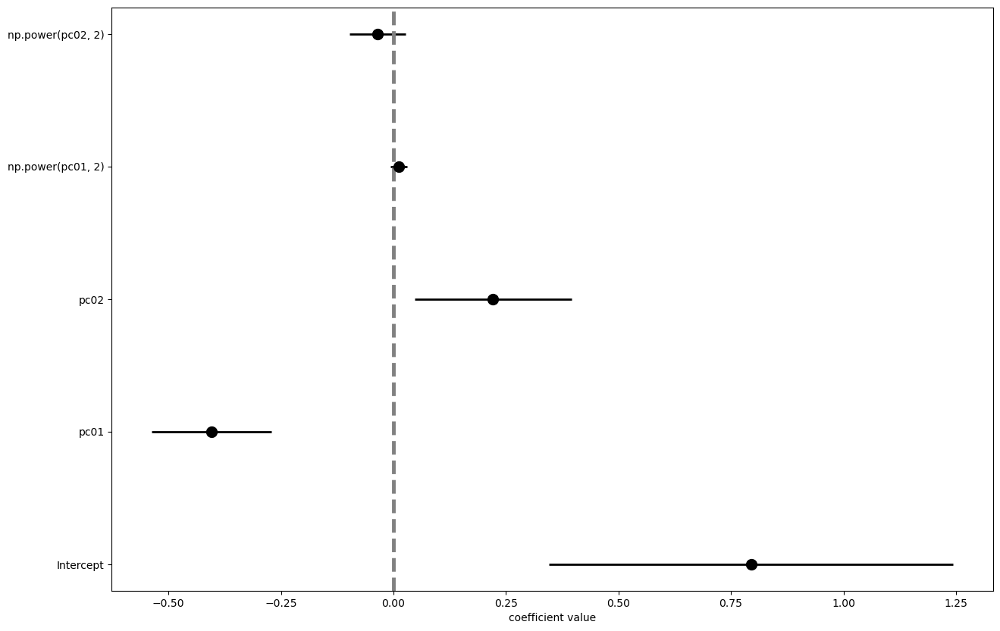

In [121]:
my_coefplot(fit_9)

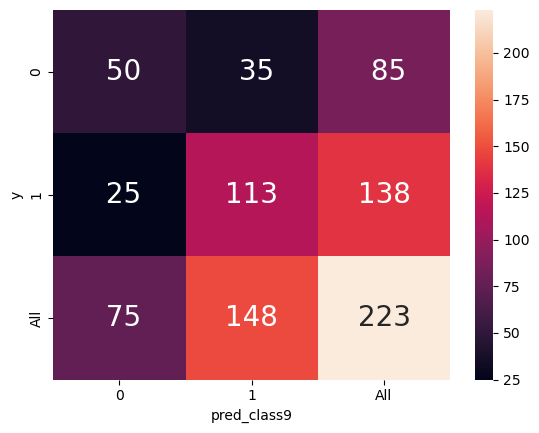

In [194]:
# Predict and classify the training set with a 0.5 threshold
input_pca_df_copy['pred_probability9'] = fit_6.predict(input_pca_df)
input_pca_df_copy['pred_class9'] = np.where(input_pca_df_copy.pred_probability9 > 0.5, 1, 0 )

# Display the confusion matrix as a heatmap
fig, ax = plt.subplots()

sns.heatmap(pd.crosstab(input_pca_df_copy.y, input_pca_df_copy.pred_class9, margins=True),
             annot=True, annot_kws={'size': 20}, fmt='3d')

plt.show()

### Model Interpretations

In [122]:
# Combine results into a dataframe and sort by descending accuracy
results_df = pd.concat(results_list, ignore_index=True)
results_df.sort_values(by=['Accuracy'], ascending=False)

,model_name,model_formula,num_coefs,threshold,Accuracy,Sensitivity,Specificity,FPR,ROC_AUC
2,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64,0.5,0.887892,0.913043,0.847059,0.152941,0.941603
1,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64,0.5,0.883408,0.927536,0.811765,0.188235,0.944757
3,4,y ~ pc01 + pc02,3,0.5,0.735426,0.818841,0.600000,0.400000,0.818073
5,6,y ~ (pc01 + pc02) **2,4,0.5,0.730942,0.818841,0.588235,0.411765,0.820034
7,8,y ~ (pc01 + pc02)**3,4,0.5,0.730942,0.818841,0.588235,0.411765,0.820034
8,9,"y ~ pc01 + pc02 + np.power(pc01,2) + np.power(...",5,0.5,0.730942,0.797101,0.623529,0.376471,0.819352
0,1,y ~ 1,1,0.5,0.618834,1.000000,0.000000,1.000000,0.500000
4,5,y ~ pc01 + pc02,3,0.5,0.618834,0.985507,0.023529,0.976471,0.524126
6,7,y ~ (pc01 + pc02) **2,4,0.5,0.614350,0.978261,0.023529,0.976471,0.519096


`Model 3` and `Model 2` had the highest accuracy out of the seven fitted models.

### ROC AUC

In [123]:
results_df.sort_values(by=['ROC_AUC'], ascending=False)

,model_name,model_formula,num_coefs,threshold,Accuracy,Sensitivity,Specificity,FPR,ROC_AUC
1,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64,0.5,0.883408,0.927536,0.811765,0.188235,0.944757
2,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64,0.5,0.887892,0.913043,0.847059,0.152941,0.941603
5,6,y ~ (pc01 + pc02) **2,4,0.5,0.730942,0.818841,0.588235,0.411765,0.820034
7,8,y ~ (pc01 + pc02)**3,4,0.5,0.730942,0.818841,0.588235,0.411765,0.820034
8,9,"y ~ pc01 + pc02 + np.power(pc01,2) + np.power(...",5,0.5,0.730942,0.797101,0.623529,0.376471,0.819352
3,4,y ~ pc01 + pc02,3,0.5,0.735426,0.818841,0.600000,0.400000,0.818073
4,5,y ~ pc01 + pc02,3,0.5,0.618834,0.985507,0.023529,0.976471,0.524126
6,7,y ~ (pc01 + pc02) **2,4,0.5,0.614350,0.978261,0.023529,0.976471,0.519096
0,1,y ~ 1,1,0.5,0.618834,1.000000,0.000000,1.000000,0.500000


In [124]:
# Combine the ROC results into a dataframe
roc_df = pd.concat(roc_list, ignore_index=True)
roc_df

,tpr,fpr,threshold,model_name,model_formula
0,0.000000,0.000000,inf,1,y ~ 1
1,1.000000,1.000000,0.618834,1,y ~ 1
2,0.000000,0.000000,inf,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...
3,0.007246,0.000000,1.000000,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...
4,0.384058,0.000000,0.983601,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...
...,...,...,...,...,...
617,0.985507,0.858824,0.207056,9,"y ~ pc01 + pc02 + np.power(pc01,2) + np.power(..."
618,0.992754,0.858824,0.202573,9,"y ~ pc01 + pc02 + np.power(pc01,2) + np.power(..."
619,0.992754,0.941176,0.124871,9,"y ~ pc01 + pc02 + np.power(pc01,2) + np.power(..."
620,1.000000,0.941176,0.113302,9,"y ~ pc01 + pc02 + np.power(pc01,2) + np.power(..."


### ROC Curve

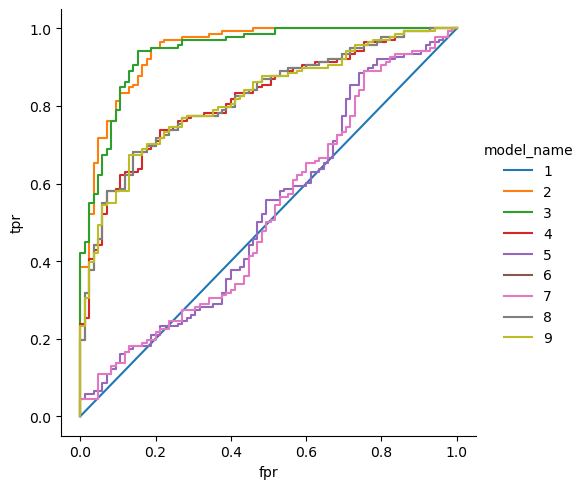

In [125]:
# Visualize the ROC curve for each model as a line chart
roc_df['model_name'] = roc_df.model_name.astype('category')

sns.relplot(data = roc_df, x='fpr', y='tpr', hue='model_name',
            kind='line', estimator=None, units='model_name')

plt.show()

We can see that the ROC Curve for `Model 2` and `Model 3` is closest to the desired right angle. Let's separate them into separate facets for easier visability.

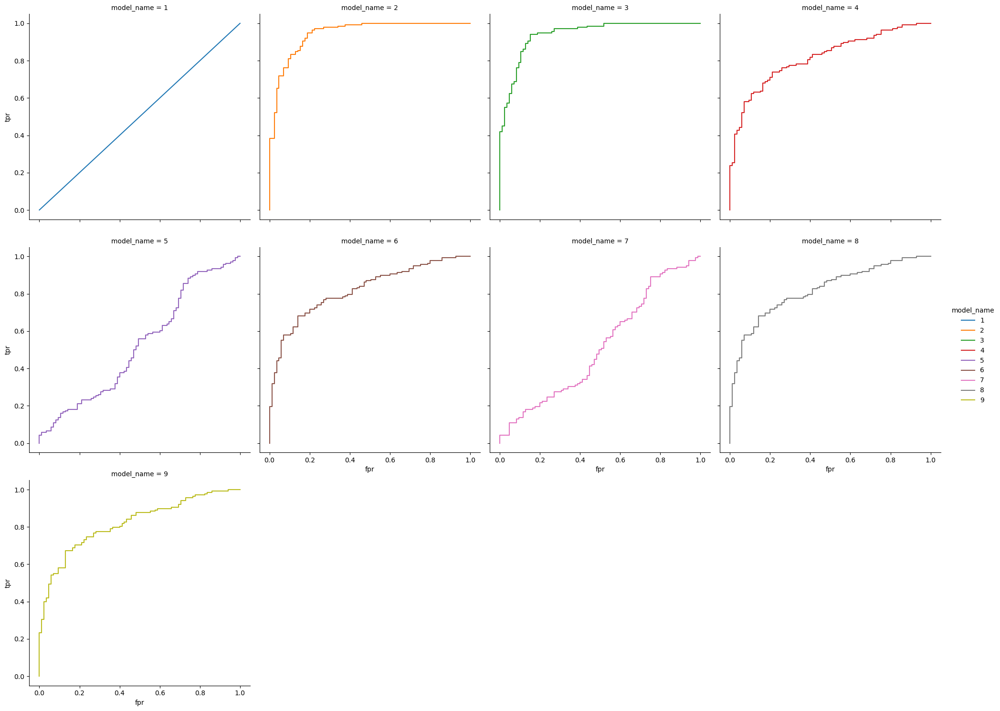

In [126]:
sns.relplot(data = roc_df, x='fpr', y='tpr', hue='model_name',
            kind='line', estimator=None, units='model_name',
            col='model_name', col_wrap=4)

plt.show()

##### Model Interpretation:
`Model 3` had the best performance on the training set with an approxmate accuracy of `88.8%`. `Model 2` was close behind with `88.3%` accuracy. They both consisted of `64` coefficients.

When considering ROC AUC, the best two models swapped place. `Model 2` had a higher ROC AUC score of `.945` and `Model 3` with `.942`. Both of these models scored better than the intercept-only model's score of `50%` accuracy and ROC AUC of `.50`. 

## E. Models: Predictions

In [127]:
# Create a prediction grid
input_grid = pd.DataFrame([ (X02, V01, V26, X01, X03, X04, X05, X06, X07, X08, X09, X10, X11,
       X12, X13, X14, X15, X16, X17, X18, X19, X20, X21,
       X22, X23, X24, X25, Z01, Z02, Z03, Z04, Z05, Z06,
       Z07, Z08, Z09, V02, V03, V04, V05, V06, V07, V08,
       V09, V10, V11, V12, V13, V14, V15, V16, V17, V18,
       V19, V20, V21, V22, V23, V24, V25, V27, V28, V29) 
                            for X02 in np.linspace(df.X02.min(), df.X02.max(), num=101)
                            for V01 in np.linspace(df.V01.min(), df.V01.max(), num=5)
                            for V26 in np.linspace(df.V26.min(), df.V26.max(), num=5)
                            for X01 in [df.X01.mean()]
                            for X03 in [df.X03.mean()]
                            for X04 in [df.X04.mean()]
                            for X05 in [df.X05.mean()]
                            for X06 in [df.X06.mean()]
                            for X07 in [df.X07.mean()]
                            for X08 in [df.X08.mean()]
                            for X09 in [df.X09.mean()]
                            for X10 in [df.X10.mean()]
                            for X11 in [df.X11.mean()]
                            for X12 in [df.X12.mean()]
                            for X13 in [df.X13.mean()]
                            for X14 in [df.X14.mean()]
                            for X15 in [df.X15.mean()]
                            for X16 in [df.X16.mean()]
                            for X17 in [df.X17.mean()]
                           for X18 in [df.X18.mean()]
                           for X19 in [df.X19.mean()]
                           for X20 in [df.X20.mean()]
                           for X21 in [df.X21.mean()]
                           for X22 in [df.X22.mean()]
                           for X23 in [df.X23.mean()]
                           for X24 in [df.X24.mean()]
                           for X25 in [df.X25.mean()]
                           for Z01 in [df.Z01.mean()]
                           for Z02 in [df.Z02.mean()]
                           for Z03 in [df.Z03.mean()]
                           for Z04 in [df.Z04.mean()]
                           for Z05 in [df.Z05.mean()]
                           for Z06 in [df.Z06.mean()]
                           for Z07 in [df.Z07.mean()]
                           for Z08 in [df.Z08.mean()]
                           for Z09 in [df.Z09.mean()]
                           for V02 in [df.V02.mean()]
                           for V03 in [df.V03.mean()]
                           for V04 in [df.V04.mean()]
                           for V05 in [df.V05.mean()]
                           for V06 in [df.V06.mean()]
                           for V07 in [df.V07.mean()]
                           for V08 in [df.V08.mean()]
                           for V09 in [df.V09.mean()]
                           for V10 in [df.V10.mean()]
                           for V11 in [df.V11.mean()]
                           for V12 in [df.V12.mean()]
                           for V13 in [df.V13.mean()]
                           for V14 in [df.V14.mean()]
                           for V15 in [df.V15.mean()]
                           for V16 in [df.V16.mean()]
                           for V17 in [df.V17.mean()]
                           for V18 in [df.V18.mean()]
                           for V19 in [df.V19.mean()]
                           for V20 in [df.V20.mean()]
                           for V21 in [df.V21.mean()]
                           for V22 in [df.V22.mean()]
                           for V23 in [df.V23.mean()]
                           for V24 in [df.V24.mean()]
                           for V25 in [df.V25.mean()]
                           for V27 in [df.V27.mean()]
                           for V28 in [df.V28.mean()]
                           for V29 in [df.V29.mean()] ],
                          columns=['X02','V01','V26','X01', 'X03', 'X04', 'X05', 'X06', 'X07', 'X08', 'X09', 'X10', 'X11',
       'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19', 'X20', 'X21',
       'X22', 'X23', 'X24', 'X25', 'Z01', 'Z02', 'Z03', 'Z04', 'Z05', 'Z06',
       'Z07', 'Z08', 'Z09', 'V02', 'V03', 'V04', 'V05', 'V06', 'V07', 'V08',
       'V09', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18',
       'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V27', 'V28', 'V29'])

In [128]:
# Create a copy of the input grid
dfviz = input_grid.copy()

In [129]:
# Add a column for predicted probability using `Model 3`
dfviz['pred_probability_mod3'] = fit_3.predict(input_grid)

In [130]:
# Add a column for predicted probability using `Model 2`
dfviz['pred_probability_mod2'] = fit_2.predict(input_grid)

In [131]:
dfviz

,X02,V01,V26,X01,X03,X04,X05,X06,X07,X08,...,V21,V22,V23,V24,V25,V27,V28,V29,pred_probability_mod3,pred_probability_mod2
0,-10.480996,-1.979633,-5.783808,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,3.948196e-40,1.0
1,-10.480996,-1.979633,-2.668105,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,1.084486e-34,1.0
2,-10.480996,-1.979633,0.447597,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,2.978856e-29,1.0
3,-10.480996,-1.979633,3.563300,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,8.182290e-24,1.0
4,-10.480996,-1.979633,6.679002,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,2.247503e-18,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2520,11.930880,2.213555,-5.783808,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,1.000000e+00,1.0
2521,11.930880,2.213555,-2.668105,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,1.000000e+00,1.0
2522,11.930880,2.213555,0.447597,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,1.000000e+00,1.0
2523,11.930880,2.213555,3.563300,-1.274516e-16,-1.115202e-16,7.119367e-17,-6.571724e-17,2.987147e-17,4.381149e-17,5.974294e-18,...,0.022254,0.118454,0.080438,0.113141,0.216649,0.949645,0.134703,-86.306579,1.000000e+00,1.0


#### Event Probability

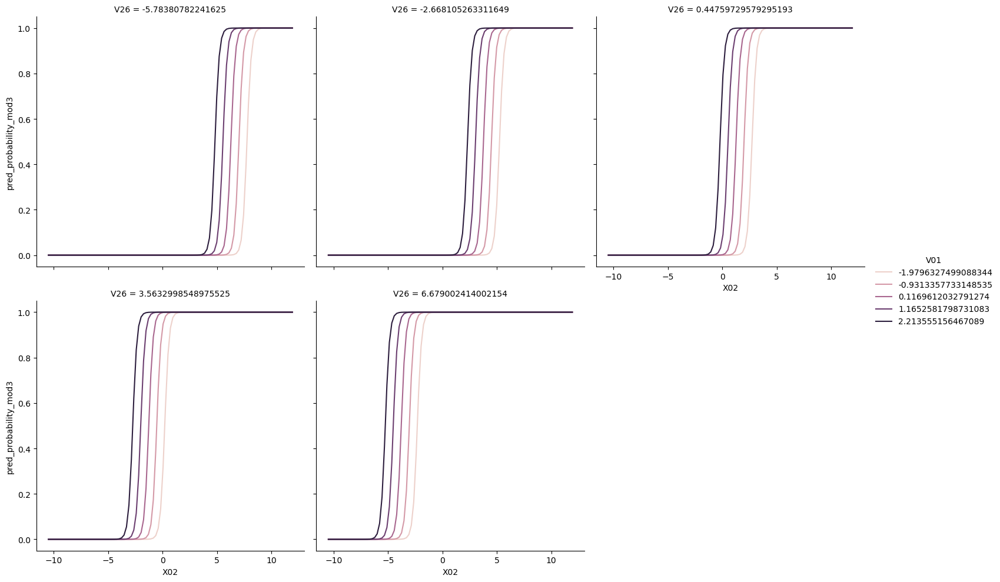

In [132]:
# Visualize the model 3 predictions
sns.relplot(data = dfviz, x='X02', y='pred_probability_mod3', hue='V01', col='V26',
            kind='line', estimator=None, units='V01',
            col_wrap=3)

plt.show()

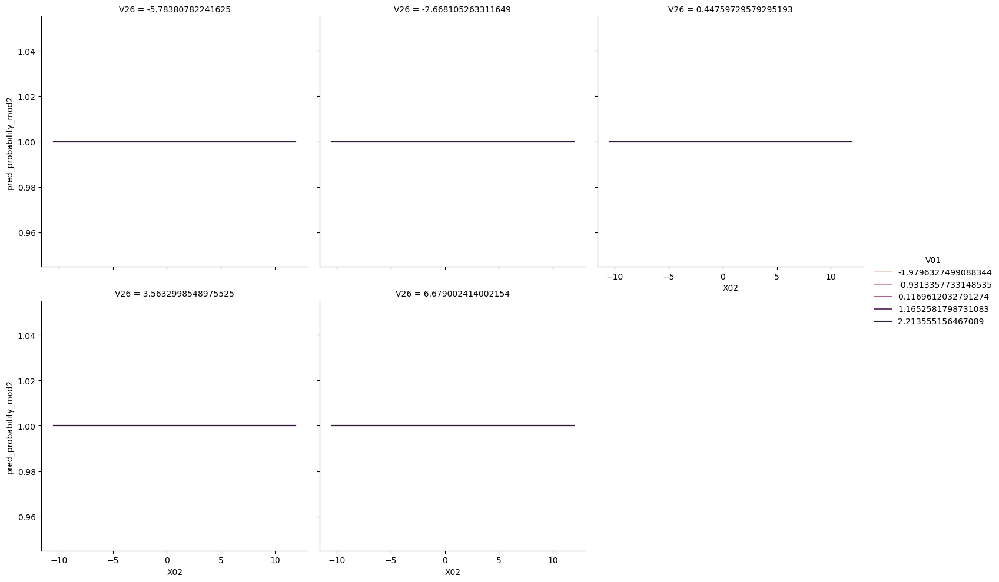

In [133]:
# Visualize the model 2 predictions
sns.relplot(data = dfviz, x='X02', y='pred_probability_mod2', hue='V01', col='V26',
            kind='line', estimator=None, units='V01',
            col_wrap=3)

plt.show()

##### Model Trends
`Model 3` predictions show that as input `X02` approaches a positive number, the predicted probabilty approaches `1`. `Model 2` shows a predicted probabilty of `1` for `X02` across all values of `V01` and `V26`. This seems to indicate that input `X02` might be influencing a failure response.

## F. Models: Performance & Validation

In [134]:
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from patsy import dmatrices

In [135]:
# Define a function to manage the cross-validation for a model and data set.
def train_and_test_logistic_with_cv(mod_name, a_formula, init_mod, data_df, cv):
    # create the feature and output arrays BASED on the provided formula
    y, X = dmatrices( a_formula, data=data_df )
    
    # initialize the performance metric storage
    train_res = []
    test_res = []
    
    # split the data and iterate over the folds
    for train_id, test_id in cv.split( X, y.ravel() ):
        # subset the training and testing features
        X_train = X[train_id]
        X_test = X[test_id]
        
        # subset the training and testing output
        y_train = y[train_id]
        y_test = y[test_id]
        
        # FIT the model on the TRAINING SET
        fit_mod = init_mod.fit( X_train, y_train.ravel() )
        
        # SCORE the model -- calculate the performance metric
        # training set SCORE
        train_res.append( fit_mod.score( X_train, y_train.ravel() ) )
        # test set SCORE
        test_res.append( fit_mod.score( X_test, y_test.ravel() ) )
    
    # book keeping
    train_df = pd.DataFrame({'Accuracy': train_res})
    train_df['from_set'] = 'training'
    train_df['fold_id'] = train_df.index + 1
    
    test_df = pd.DataFrame({'Accuracy': test_res})
    test_df['from_set'] = 'testing'
    test_df['fold_id'] = test_df.index + 1
    
    # combine the results together
    res_df = pd.concat([train_df, test_df], ignore_index=True)
    
    # add information about the model
    res_df['model_name'] = mod_name
    res_df['model_formula'] = a_formula
    res_df['num_coefs'] = fit_mod.coef_.ravel().size
    
    return res_df

In [136]:
# Use 5-fold cross-validation
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=9483156)

In [137]:
# Initialize the sklearn Logistic Regression model
sk_min_loss = LogisticRegression(penalty=None, solver='lbfgs', fit_intercept=False, max_iter=25001)

In [138]:
df_train = df.rename(columns={'Y': 'y'}).copy()

In [205]:
pca_train = input_pca_df.copy()

In [139]:
# Create a list to hold reusults from three different models
train_test_results_list = []

In [140]:
# Train and test results for `model 3`
train_and_test_logistic_with_cv(3, formula_3, init_mod=sk_min_loss, data_df=df_train, cv=kf)

,Accuracy,from_set,fold_id,model_name,model_formula,num_coefs
0,0.943820,training,1,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
1,1.000000,training,2,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
2,0.915730,training,3,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
3,0.910615,training,4,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
4,1.000000,training,5,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
5,0.622222,testing,1,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
6,0.644444,testing,2,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
7,0.777778,testing,3,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
8,0.750000,testing,4,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
9,0.659091,testing,5,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64


In [141]:
train_test_results_list.append(train_and_test_logistic_with_cv(3, formula_3, init_mod=sk_min_loss, data_df=df_train, cv=kf))

In [142]:
# Train and test results for `model 2`
train_and_test_logistic_with_cv(2, formula_2, init_mod=sk_min_loss, data_df=df_train, cv=kf)

,Accuracy,from_set,fold_id,model_name,model_formula,num_coefs
0,0.943820,training,1,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
1,1.000000,training,2,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
2,0.915730,training,3,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
3,0.910615,training,4,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
4,1.000000,training,5,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
5,0.622222,testing,1,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
6,0.644444,testing,2,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
7,0.777778,testing,3,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
8,0.750000,testing,4,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
9,0.659091,testing,5,2,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64


In [143]:
train_test_results_list.append(train_and_test_logistic_with_cv(2, formula_2, init_mod=sk_min_loss, data_df=df_train, cv=kf))

In [206]:
# Train and test results for `model 4`
train_and_test_logistic_with_cv(4, 'y ~ pc01 + pc02', init_mod=sk_min_loss, data_df=pca_train, cv=kf)

,Accuracy,from_set,fold_id,model_name,model_formula,num_coefs
0,0.730337,training,1,4,y ~ pc01 + pc02,3
1,0.724719,training,2,4,y ~ pc01 + pc02,3
2,0.724719,training,3,4,y ~ pc01 + pc02,3
3,0.737430,training,4,4,y ~ pc01 + pc02,3
4,0.737430,training,5,4,y ~ pc01 + pc02,3
5,0.733333,testing,1,4,y ~ pc01 + pc02,3
6,0.755556,testing,2,4,y ~ pc01 + pc02,3
7,0.733333,testing,3,4,y ~ pc01 + pc02,3
8,0.704545,testing,4,4,y ~ pc01 + pc02,3
9,0.659091,testing,5,4,y ~ pc01 + pc02,3


In [208]:
train_test_results_list.append(train_and_test_logistic_with_cv(4, 'y ~ pc01 + pc02', init_mod=sk_min_loss, data_df=pca_train, cv=kf))

In [209]:
cv_results = pd.concat(train_test_results_list, ignore_index=True )
cv_results

,Accuracy,from_set,fold_id,model_name,model_formula,num_coefs
0,0.943820,training,1,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
1,1.000000,training,2,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
2,0.915730,training,3,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
3,0.910615,training,4,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
4,1.000000,training,5,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
5,0.622222,testing,1,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
6,0.644444,testing,2,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
7,0.777778,testing,3,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
8,0.750000,testing,4,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64
9,0.659091,testing,5,3,y ~ X01 + X02 + X03 + X04 + X05 + X06 + X07 + ...,64


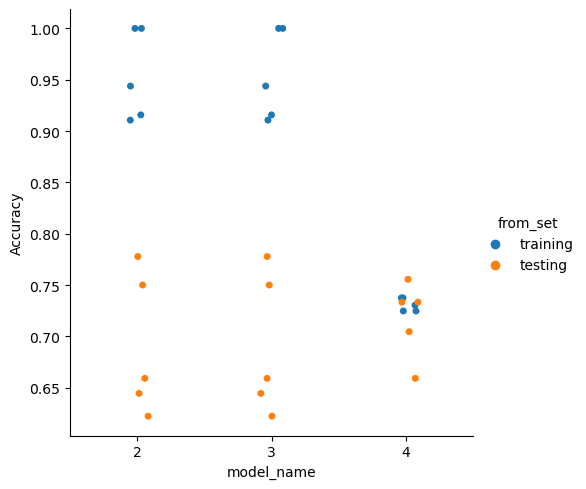

In [210]:
# Visualize the accuracy for each model in each fold with a strip plot
sns.catplot(data = cv_results, x='model_name', y='Accuracy', hue='from_set')

plt.show()

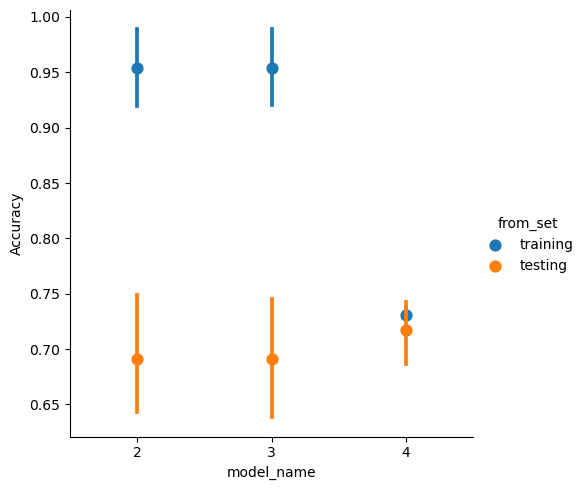

In [212]:
# Visualize the accuracy with a point plot
sns.catplot(data = cv_results, x='model_name', y='Accuracy', hue='from_set', kind='point', join=False,
            errorbar=('ci', 95))

plt.show()

Based on the performance of the models we determined that `model 2` and `model 3` had the highest accuracy for the `training data`. They both had 64 regression coefficients. However, `module 4` performed better with the `testing data`! It had only 2 coefficients. Using PCs to remove correlation may have improved the accuracy on the test data. All three models had a prediction accuracy above the desired 61.88% threshold.